# Thématique 6 - Le Clustering

### Importation des librairies

In [102]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Data pre-processing

In [103]:
def load_data(filepath, filename, sep):
    # Creating file path
    file = os.path.join(filepath, filename)

    # Reading data
    df = pd.read_csv(file, sep=sep, header=None)

    return df

In [104]:
# Préparation du fichier de données
filepath = "../data"
filename_distincts = "Test_Clusters_Distincts.txt"
filename_melanges = "Test_Clusters_Melanges.txt"
filename_random = "Test_Clusters_Random.txt"
filename_corr = "Test_Clusters_Corr.txt"
filename_atypique = "Test_Clusters_Atypiques.txt"

# Lecture des données
df_distincts = load_data(filepath, filename_distincts, sep=" ")
df_melanges = load_data(filepath, filename_melanges, sep=" ")
df_random = load_data(filepath, filename_random, sep=" ")
df_corr = load_data(filepath, filename_corr, sep="\t")
df_atypique = load_data(filepath, filename_atypique, sep=" ")

df_distincts

,0,1,2,3,4,5
0,0.112213,0.614523,-0.120554,-0.076287,0.844718,0.376434
1,-0.404110,-0.042121,0.574591,-0.204818,0.360084,1.398744
2,-0.018190,0.263355,0.429380,0.755978,0.301715,0.449145
3,1.693847,1.382552,0.834288,1.245551,1.641393,1.114700
4,0.721389,-0.407652,0.573885,0.201700,0.742344,2.211372
...,...,...,...,...,...,...
1495,-5.364474,-7.480989,-4.290441,-5.613863,-4.984595,-5.019052
1496,-5.096874,-5.247322,-2.805660,-5.213406,-6.615722,-5.550547
1497,-4.875043,-5.191675,-4.115250,-5.119673,-4.942491,-4.359110
1498,-4.630835,-4.137863,-5.053504,-4.286439,-4.844066,-2.356118


In [105]:
df_distincts.shape

(1500, 6)

On sait qu'il y a 33 pays pour 3 variables à étudier.

In [106]:
df_distincts.dtypes

0    float64
1    float64
2    float64
3    float64
4    float64
5    float64
dtype: object

Dans cette étude, nous avons que des variables quantitatives.

In [107]:
df_distincts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1500 non-null   float64
 1   1       1500 non-null   float64
 2   2       1500 non-null   float64
 3   3       1500 non-null   float64
 4   4       1500 non-null   float64
 5   5       1500 non-null   float64
dtypes: float64(6)
memory usage: 70.4 KB


In [108]:
df_random.columns

Index([0, 1, 2, 3, 4, 5], dtype='int64')

In [109]:
df_distincts.isnull().sum()

0    0
1    0
2    0
3    0
4    0
5    0
dtype: int64

Le jeu de données n'a pas l'air de présenter de données manquantes.

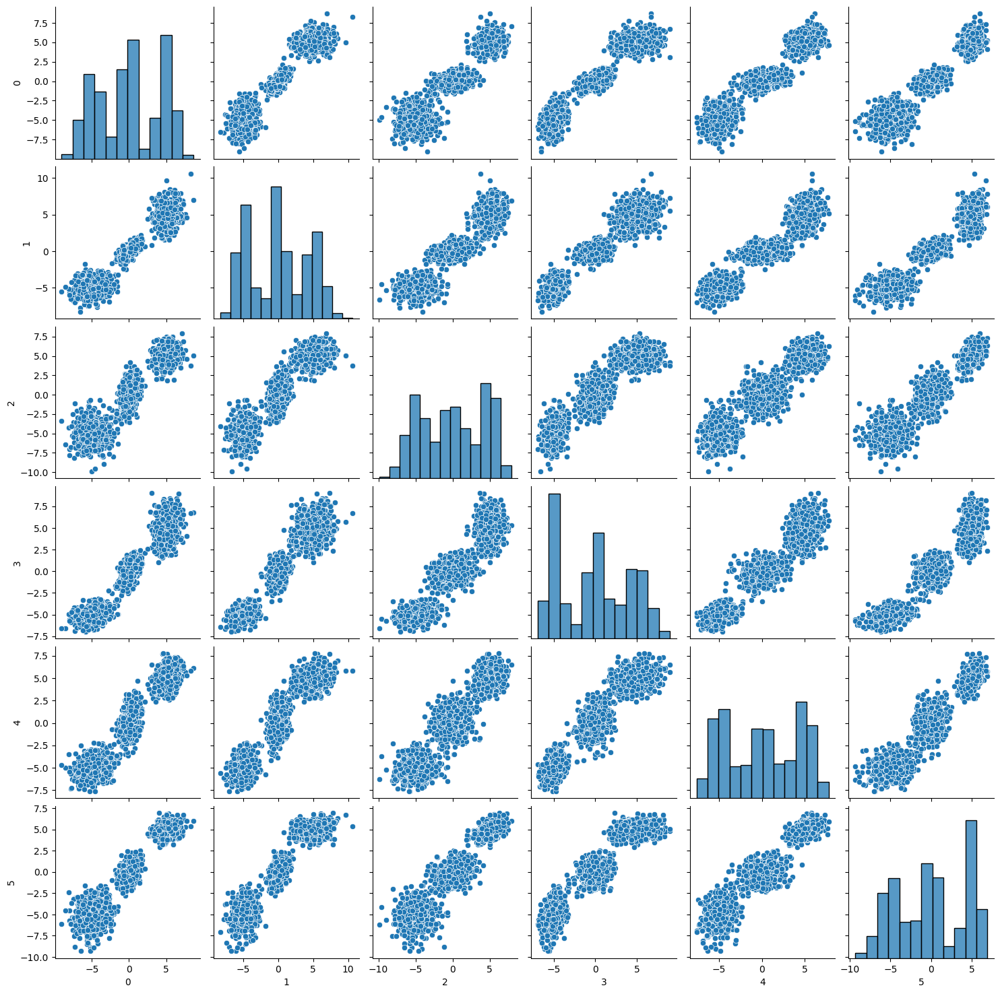

In [110]:
# Pairplot
sns.pairplot(df_distincts, diag_kind="hist")

Afficher le pairplot permet de démontrer qu'il y a tout de même une certaine cohérence dans les données du fichier 'Distincts'. En effet, visuellement, on distingue déjà 3 clusters pour chaque combinaison de nuage de points.

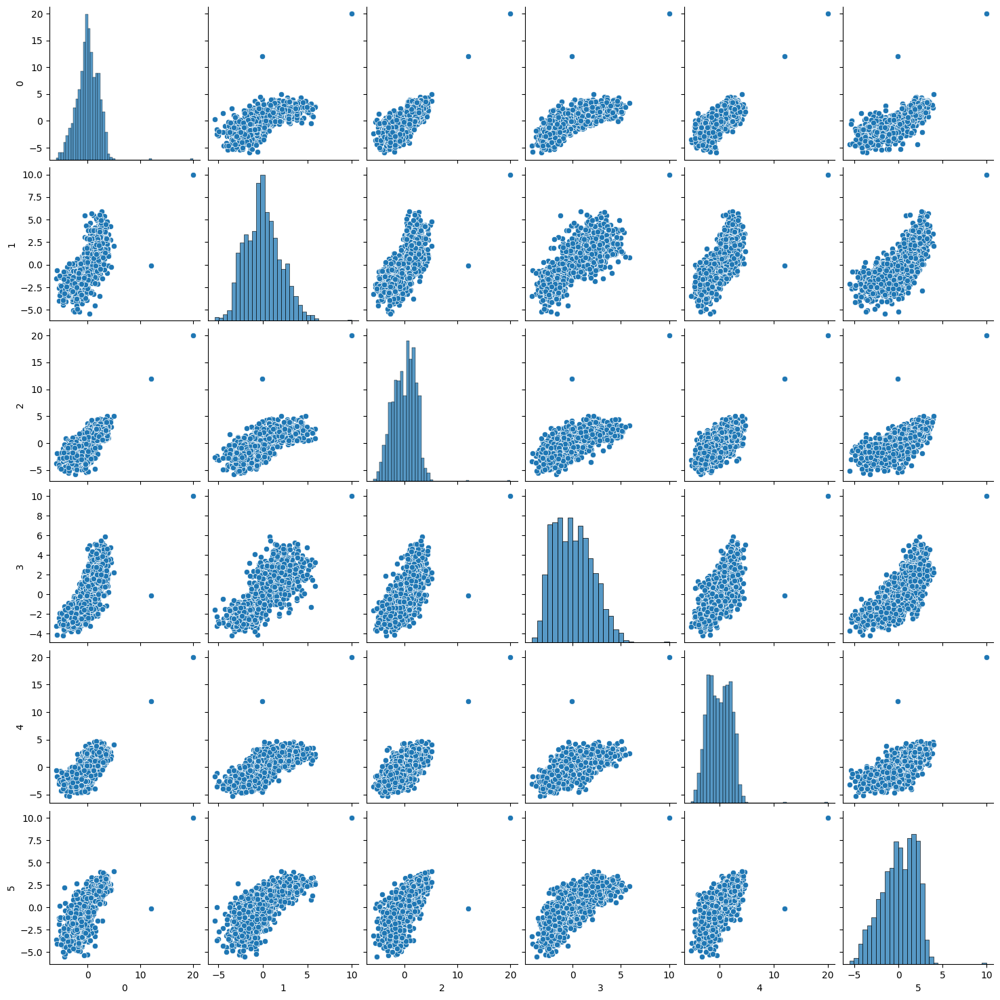

In [111]:
# Pairplot
sns.pairplot(df_atypique, diag_kind="hist")

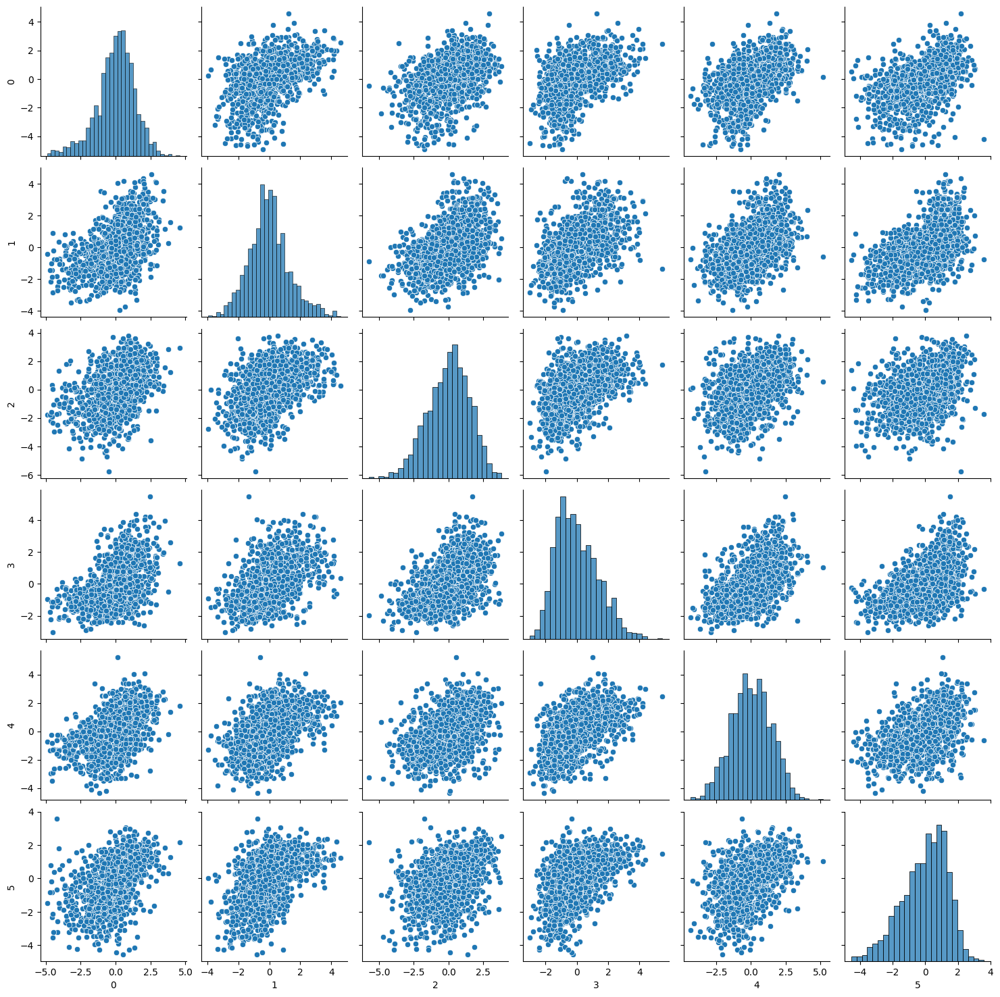

In [112]:
# Pairplot
sns.pairplot(df_melanges, diag_kind="hist")

Même si les nuages de points sont affichés 2 à 2, la classification s'annonce assez difficile car aucun cluster n'apparaît clairement si l'on souhaite en considérer plus que 1.

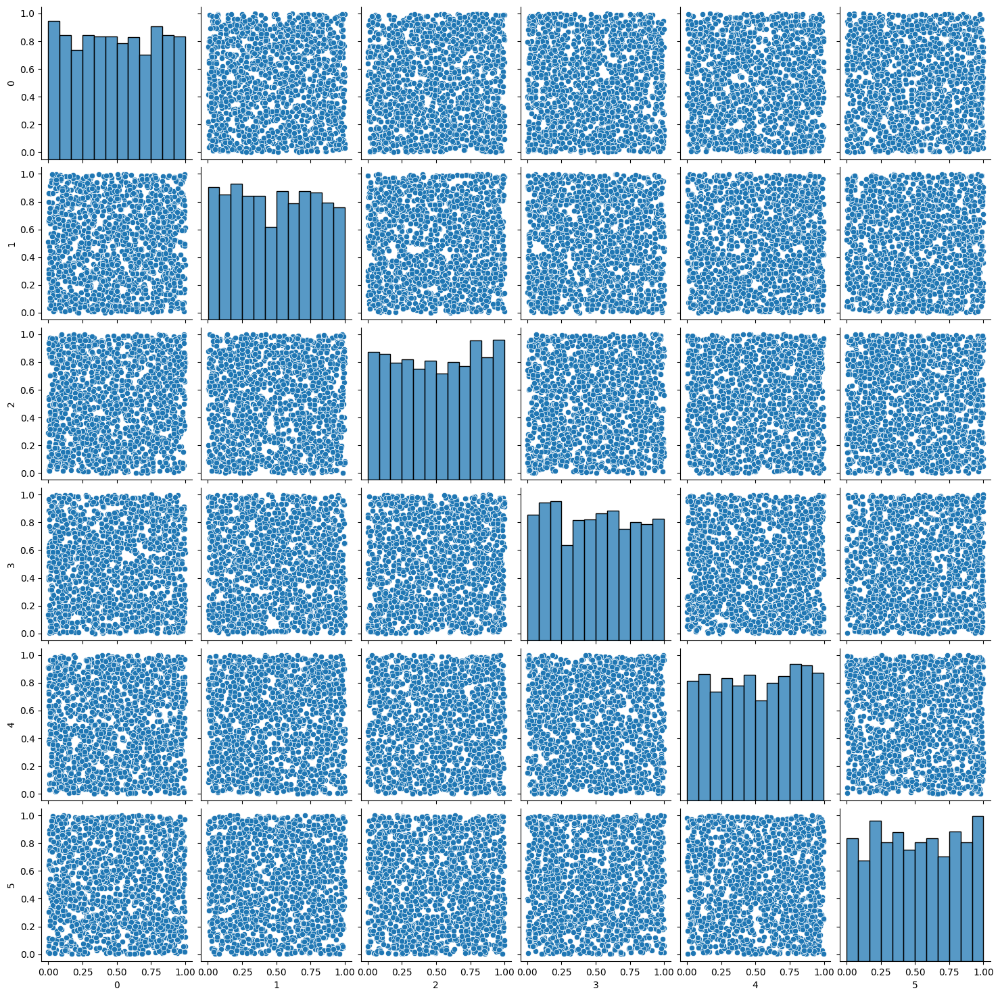

In [113]:
# Pairplot
sns.pairplot(df_random, diag_kind="hist")

Même si les nuages de points sont affichés 2 à 2, la classification s'annonce assez difficile car aucun cluster n'apparaît clairement si l'on souhaite en considérer plus que 1.

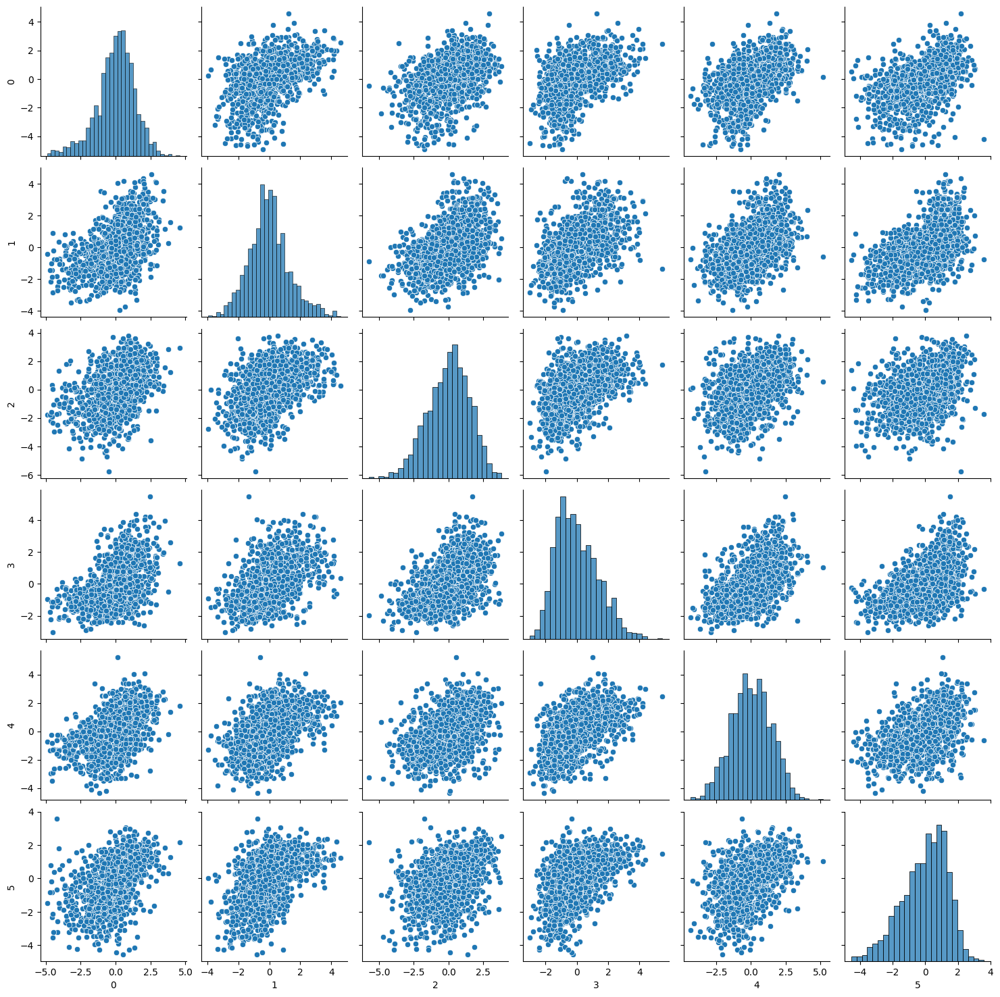

In [114]:
# Pairplot
sns.pairplot(df_melanges, diag_kind="hist")

Même si les nuages de points sont affichés 2 à 2, la classification s'annonce assez difficile car aucun cluster n'apparaît clairement si l'on souhaite en considérer plus que 1.

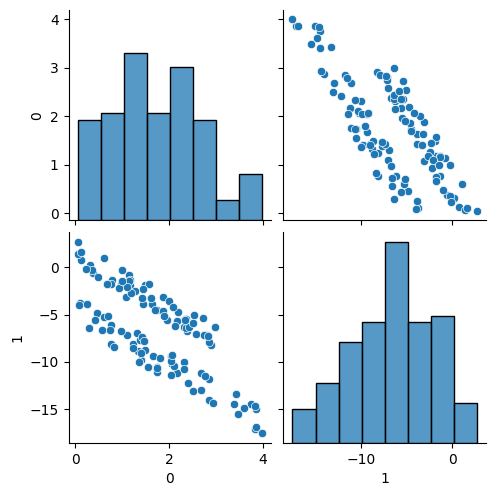

In [115]:
# Pairplot
sns.pairplot(df_corr, diag_kind="hist")

**Remarque** : Ces représentations des nuages de points 2 à 2 permettent de montrer les corrélations entre les variables, mais ne fait pas ressortir directement les éventuelles classes car le pairplot met en évidence là corrélation entre 2 variables alors que nous sommes entrain d'étudier les individus. Pour visualiser d'éventuelles groupement dans un espace de 2 dimensions, nous allons effectuer une ACP.

## Test d'une ACP pour visualiser les données en 2 dimensions

In [116]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def acp(data):
    # Centering and reducting data
    scaler = StandardScaler()
    df_scaled = data.copy()
    df_scaled = scaler.fit_transform(data)

    df_scaled = pd.DataFrame(df_scaled)

    # Réaliser l'ACP
    pca = PCA(n_components=2)
    components = pca.fit_transform(df_scaled)

    # Variance expliquée par chaque composante principale
    explained_variance = pca.explained_variance_ratio_

    # Affichage des individus sur les deux premières composantes principales
    plt.figure(figsize=(8, 6))
    plt.scatter(components[:, 0], components[:, 1], c='blue', s=50)

    # Titres et étiquettes
    plt.title('Projection des individus sur les axes 1 et 2 de l\'ACP')
    plt.xlabel(f'Axe 1 ({explained_variance[0]*100:.2f}% variance expliquée)')
    plt.ylabel(f'Axe 2 ({explained_variance[1]*100:.2f}% variance expliquée)')
    plt.grid(True)
    plt.show()

    return components

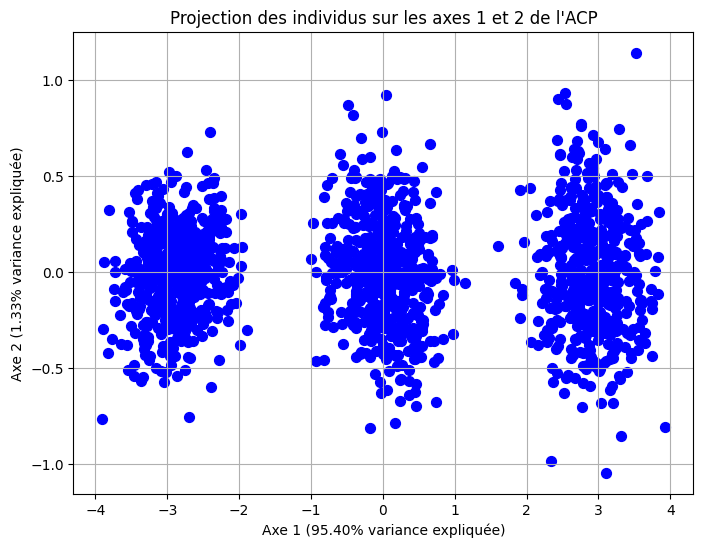

In [117]:
acp_distincts = acp(df_distincts)

Même avec une ACP sur les données, les 3 clusters sont toujours distinguables sur le jeu de données Distincts.

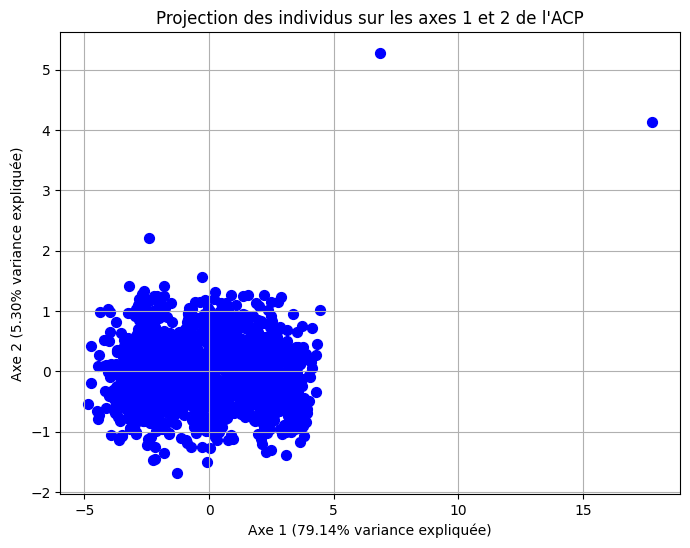

In [118]:
acp_atypique = acp(df_atypique)

Au vu du nuage de points que propre l'ACP, il risque d'y avoir un gros cluster, là où il y a la concentration des données et quelques petits avec les individus atypiques.

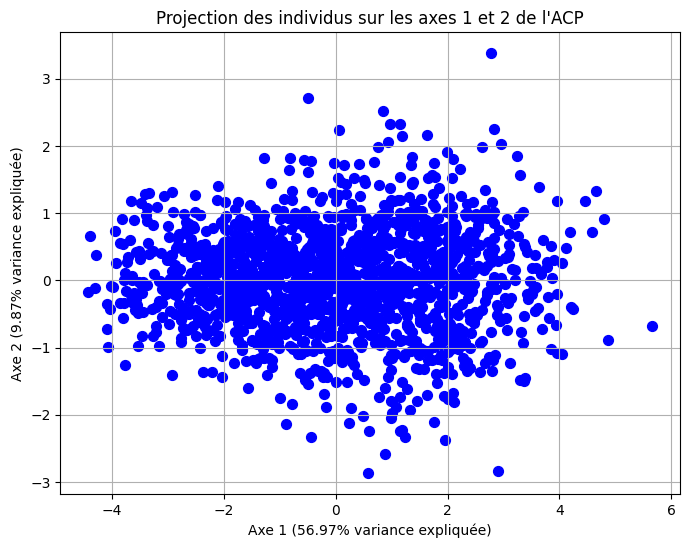

In [119]:
acp_melanges = acp(df_melanges)

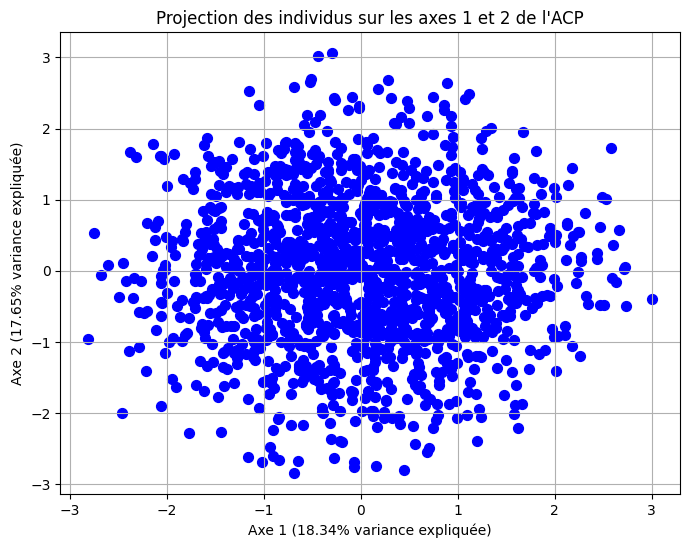

In [120]:
acp_random = acp(df_random)

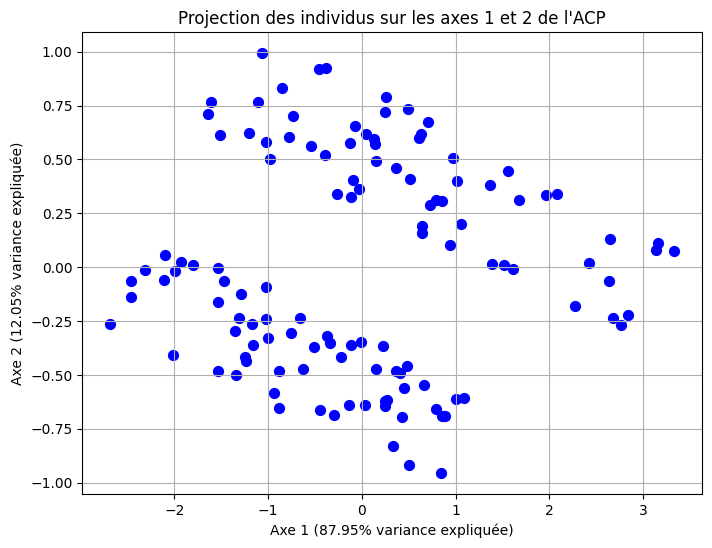

In [121]:
acp_corr = acp(df_corr)

Il n'était pas nécessaire d'effectuer une ACP sur corr car elle n'a que 2 variables, mais les données sont au moins centrées et réduites.

## Modification du type des données

In [122]:
df_distincts = np.array(df_distincts)
df_melanges = np.array(df_melanges)
df_random = np.array(df_random)
df_corr = np.array(df_corr)
df_atypique = np.array(df_atypique)

acp_distincts = np.array(acp_distincts)
acp_melanges = np.array(acp_melanges)
acp_random = np.array(acp_random)
acp_corr = np.array(acp_corr)
acp_atypique = np.array(acp_atypique)

print(df_distincts)

[[ 0.11221284  0.61452325 -0.12055387 -0.0762865   0.84471761  0.37643355]
 [-0.4041098  -0.04212103  0.57459125 -0.20481783  0.36008444  1.39874402]
 [-0.01818988  0.26335497  0.42937987  0.75597786  0.30171527  0.44914491]
 ...
 [-4.87504346 -5.19167485 -4.11525044 -5.11967297 -4.94249058 -4.35911012]
 [-4.63083452 -4.13786306 -5.05350371 -4.28643913 -4.84406578 -2.35611812]
 [-5.6422878  -6.13694969 -6.09900767 -5.0827717  -5.26902    -5.53586113]]


**Remarque** : Il est important de transformer les données en une liste.

## Algorithme des K-means

In [190]:
# Fonction pour visualiser les clusters avec centroids
def plot_clusters(data, labels, n_clusters, title, centroids=None):
    plt.figure(figsize=(10, 6))

    # Génération d'un ensemble de couleurs pour les différents clusters
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Couleur pour le bruit (label -1)
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        # Afficher les points appartenant au cluster
        xy = data[class_member_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

    if centroids is not None:
        plt.scatter(centroids['Feature_0'], centroids['Feature_1'], marker="+", color='black', s=300, linewidth=3, label='Centroids', zorder=2)

    plt.title(f'{title} - Nombre de clusters: {n_clusters}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

In [147]:
# Fonction pour afficher un pairplot
def pairplot(clusters, centroids):
    # Créer le pairplot
    pairplot = sns.pairplot(clusters, hue='Cluster', palette='Set1', diag_kind='hist')

    # Ajouter les centroids au plot
    for i, j in zip(*np.triu_indices_from(pairplot.axes, 1)):
        ax = pairplot.axes[i, j]
        ax.scatter(centroids.iloc[:, j], centroids.iloc[:, i], marker="+", color='black', s=50, label='Centroid')

    pairplot.fig.suptitle('Classification 2 à 2 des variables', y=1.01)

La fonction ci-dessous permet d'appliquer k-means en plotant un graphe montrant l'inertie pour chaque cluster, ainsi que le coude associé.

In [156]:
from sklearn.cluster import KMeans
from kneed import KneeLocator

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

def compute_inertia(k_range, tab_data, tab_label_data, plot_bool, pairplot_bool=False, centroid=None):
    # Initialisation de variables
    index = 0  # Indice de boucle
    coude = -1 # Valeur du coude

    if plot_bool:
        plt.figure(figsize=(10, 6))

    for tab in tab_data:
        # Tableau pour stocker les valeurs de l'inerties
        inertie = []

        for k in k_range:
            # Si des centroids initiaux ont été définis
            if centroid is not None:
                # k-means avec i clusters
                kmeans = KMeans(n_clusters=k, init=centroid, n_init=1, random_state=0)
            else:
                # k-means avec i clusters
                kmeans = KMeans(n_clusters=k, random_state=0)
            
            kmeans.fit(tab)

            # Calcul de l'inertie totale et intra-cluster
            inertie_intra = kmeans.inertia_                    # Inertie intra-cluster
            inertie_totale = np.sum((tab - np.mean(tab)) ** 2) # Inertie totale
            inertie_inter = inertie_totale - inertie_intra     # Inertie inter-cluster

            # Calcul du pourcentage d'inertie expliquée
            inertie_expliquee = 1 - (inertie_intra / inertie_totale)

            # Ajouter les statistiques dans le tableau
            inertie.append({
                'Nombre de clusters': k,
                'Inertie intra': inertie_intra,
                'Inertie inter': inertie_inter,
                'Inertie totale': inertie_totale,
                'Inertie expliquée (%)': inertie_expliquee * 100,
                'Inertie par cluster' : inertie_intra / k
            })

        # Convertir les inerties en DataFrame
        inertie_df = pd.DataFrame(inertie)

        # Trouver le "coude" à l'aide de KneeLocator
        kl = KneeLocator(k_range, inertie_df['Inertie intra'], curve="convex", direction="decreasing")
        coude = kl.elbow

        # Plot des inerties
        if plot_bool:

            plt.plot(k_range, inertie_df['Inertie par cluster'], marker='o', linestyle='dashed', linewidth=2, markersize=12, label=tab_label_data[index])

            # S'il y a un coude, le placer sur l'image
            if coude and coude != -1:
                plt.annotate(f'Coude: {coude}', 
                                xy=(coude, inertie_df.loc[coude-2, 'Inertie par cluster']),
                                xytext=(coude+0.5, inertie_df.loc[coude-2, 'Inertie par cluster'] + 0.01),
                                arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2"),
                                fontsize=12)

            plt.xlabel('Nombre de clusters')
            plt.ylabel('Inertie expliquée (%)')
            plt.title('Évolution de l\'inertie en fonction du nombre de clusters')
            plt.grid(True)
            plt.legend(title="Jeu de données")

        print(f"Tableau des inerties de {tab_label_data[index]} :\n")
        print(inertie_df)
        print()

        index += 1

    if plot_bool:
        plt.show()

        # Fermeture de la figure pour éviter qu'elles se chevauchent
        plt.close()

    # Pairplot
    if pairplot_bool and coude != -1 and coude:
        # k-means avec le nombre de clusters trouvé par la méthode du coude
        kmeans = KMeans(n_clusters=coude, random_state=0)
        kmeans.fit(tab)
    
        # Ajout des labels de clusters aux données
        tab_with_clusters = pd.DataFrame(tab, columns=[f"Feature_{i}" for i in range(tab.shape[1])])
        tab_with_clusters['Cluster'] = kmeans.labels_

        # Centroids pour le plot
        centroids = kmeans.cluster_centers_
        centroids_df = pd.DataFrame(centroids, columns=[f"Feature_{i}" for i in range(tab.shape[1])])
        centroids_df['Cluster'] = range(centroids.shape[0])

        if tab.shape[1] > 2:
            pairplot(tab_with_clusters, centroids_df)
        else:
            # Plot des clusters
            plot_clusters(tab, tab_with_clusters['Cluster'], coude, f"Clusters K-Means après ACP pour {tab_label_data[index - 1]}", centroids_df)

        # Afficher le plot
        plt.show()

        # Fermer la figure du pairplot
        plt.close()
    elif not coude:
        # k-means avec le nombre de clusters trouvé par la méthode du coude
        kmeans = KMeans(n_clusters=3, random_state=0)
        kmeans.fit(tab)
    
        # Ajout des labels de clusters aux données
        tab_with_clusters = pd.DataFrame(tab, columns=[f"Feature_{i}" for i in range(tab.shape[1])])
        tab_with_clusters['Cluster'] = kmeans.labels_

        # Centroids pour le plot
        centroids = kmeans.cluster_centers_
        centroids_df = pd.DataFrame(centroids, columns=[f"Feature_{i}" for i in range(tab.shape[1])])
        centroids_df['Cluster'] = range(centroids.shape[0])

        if tab.shape[1] > 2:
            pairplot(tab_with_clusters, centroids_df)
        else:
            # Plot des clusters
            plot_clusters(tab, tab_with_clusters['Cluster'], coude, "Clusters K-Means après ACP pour Distincts", centroids_df)

        # Afficher le plot
        plt.show()

        # Fermer la figure du pairplot
        plt.close()

Tableau des inerties de Distincts :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2   48285.555008  112666.617762    160952.17277   
1                   3   11410.757580  149541.415189    160952.17277   
2                   4   10429.180851  150522.991919    160952.17277   
3                   5    9449.752764  151502.420006    160952.17277   
4                   6    8582.982611  152369.190159    160952.17277   
5                   7    8134.876477  152817.296293    160952.17277   
6                   8    7752.211752  153199.961018    160952.17277   

   Inertie expliquée (%)  Inertie par cluster  
0              70.000060         24142.777504  
1              92.910467          3803.585860  
2              93.520323          2607.295213  
3              94.128844          1889.950553  
4              94.667371          1430.497102  
5              94.945780          1162.125211  
6              95.183531           969.026469  



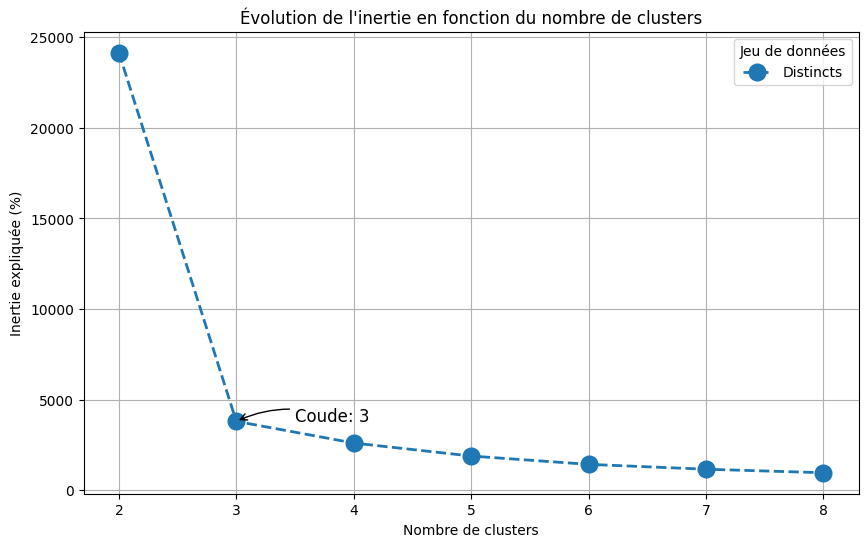

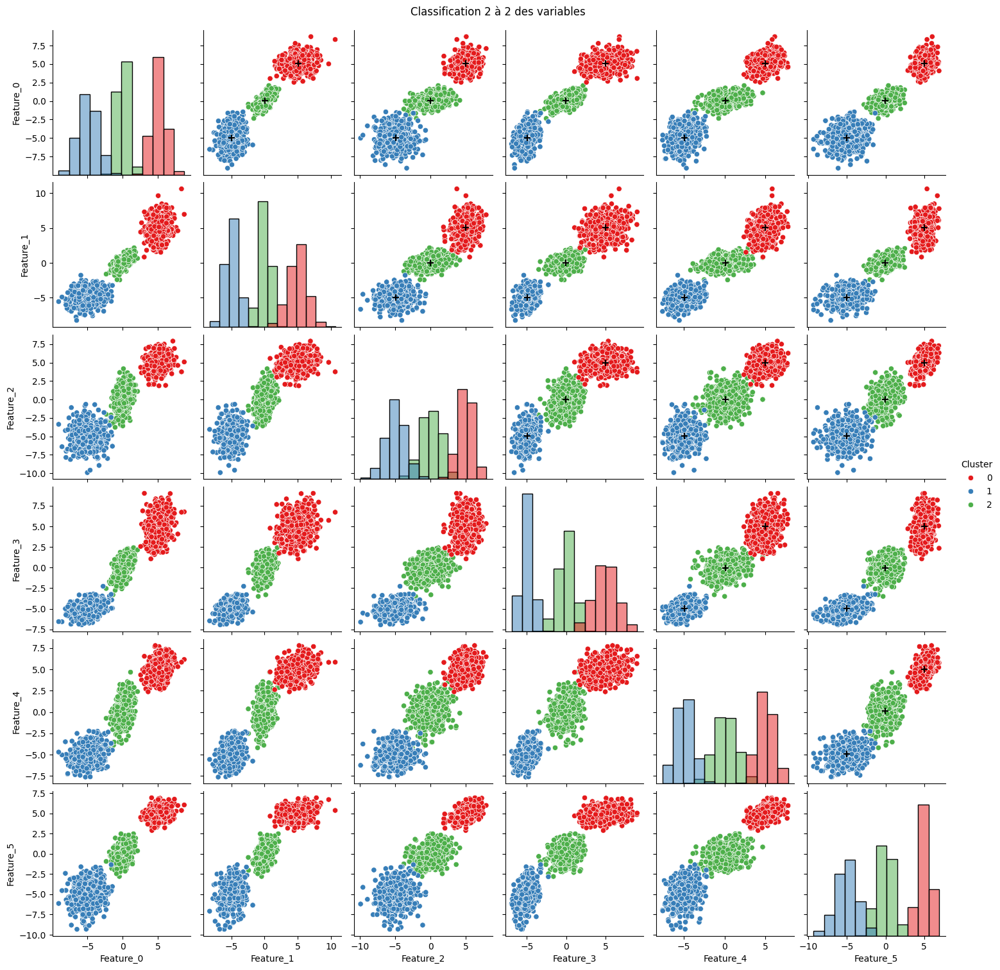

In [186]:
# Initialisation de variables
k_range = range(2, 9)          # Nombre de cluster
tab_data = [df_distincts]      # Tableaux de données à étudier
tab_label_data = ['Distincts'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Le pourcentage d'inertie expliquée par ces différentes répartitions est compris entre 70 et 95,2%. Dans le cas ci-dessus, plus nous augmentons le nombre de clusters, plus l'inertie expliquée augmente, surtout pour k > 2. Cela signifie que ces répartitions expliquent au moins 70% de la variance totale des données.

Par contre, l'inertie par cluster est bien plus importante si l'on considère que 2 cluster. Comme le montre le graphique ci-dessus, le coude est fixé à 3 clusters, ce qui indique la meilleure répartition. Répartition très bien représentée sur le pairplot ci-dessus.

Tableau des inerties de Distincts :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2    2405.122205    6300.269731     8705.391937   
1                   3     343.069633    8362.322303     8705.391937   
2                   4     290.005353    8415.386584     8705.391937   
3                   5     240.691968    8464.699969     8705.391937   
4                   6     194.145140    8511.246797     8705.391937   
5                   7     172.521265    8532.870672     8705.391937   
6                   8     155.747219    8549.644718     8705.391937   

   Inertie expliquée (%)  Inertie par cluster  
0              72.372040          1202.561103  
1              96.059113           114.356544  
2              96.668670            72.501338  
3              97.235139            48.138394  
4              97.769829            32.357523  
5              98.018225            24.645895  
6              98.210911            19.468402  



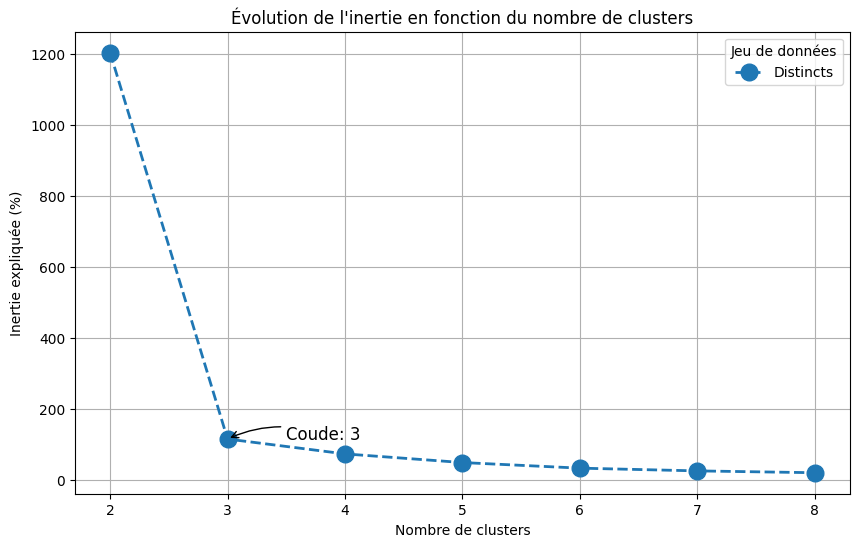

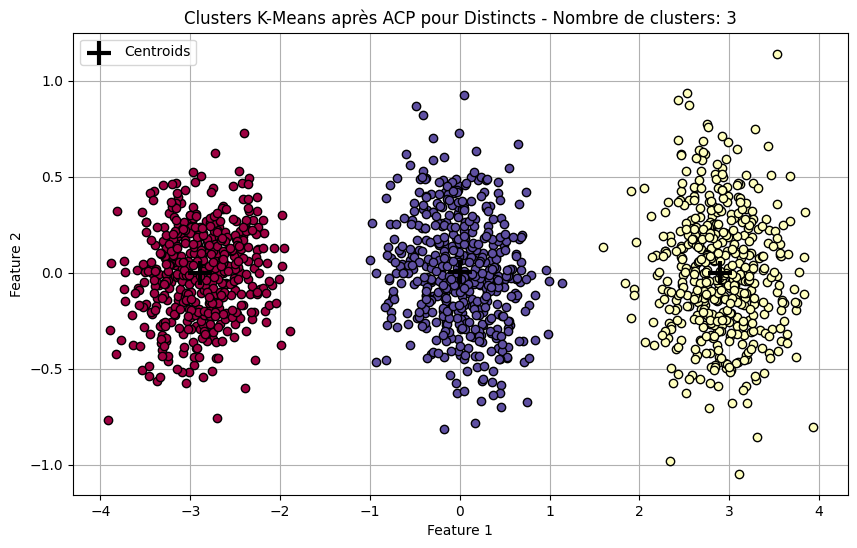

In [191]:
# Initialisation de variables
k_range = range(2, 9)          # Nombre de cluster
tab_data = [acp_distincts]     # Tableaux de données à étudier
tab_label_data = ['Distincts'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Cette analyse est complémentaire à celle plus haut où les clusters étaient affichés 2 à 2 pour chaque variable car la représentation du jeu de données 'Distincts' en 2 dimensions avec une ACP avant d'effectuer K-Means permet de distinguer très clairement les 3 clusters. On a donc la confirmation qu'il y a bien une certaine corrélation entre les données.

Tableau des inerties de Distincts :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2   48285.555008  112666.617762    160952.17277   
1                   3   11410.757580  149541.415189    160952.17277   
2                   4   10429.180851  150522.991919    160952.17277   
3                   5    9449.752764  151502.420006    160952.17277   
4                   6    8582.982611  152369.190159    160952.17277   
5                   7    8134.876477  152817.296293    160952.17277   
6                   8    7752.211752  153199.961018    160952.17277   
7                   9    7409.643888  153542.528882    160952.17277   
8                  10    7134.629653  153817.543117    160952.17277   

   Inertie expliquée (%)  Inertie par cluster  
0              70.000060         24142.777504  
1              92.910467          3803.585860  
2              93.520323          2607.295213  
3              94.128844          1889.950553  
4           

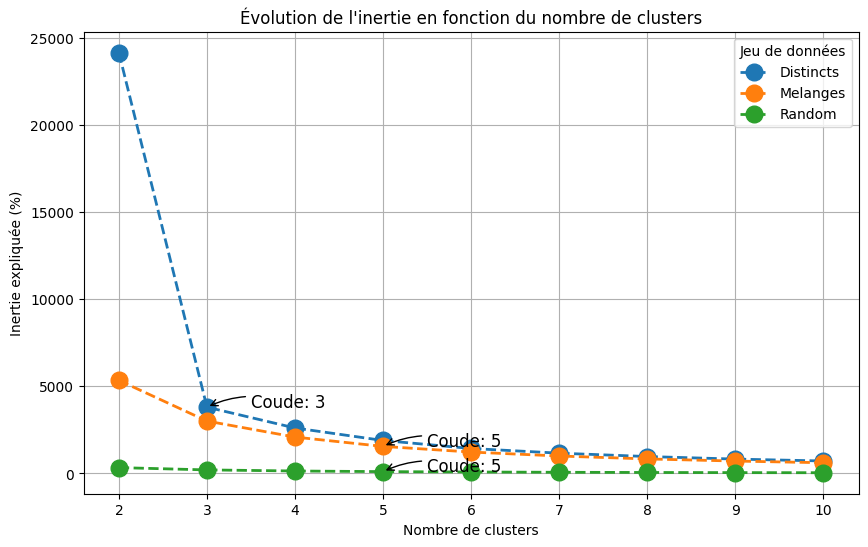

In [128]:
# Initialisation de variables
k_range = range(2, 11)                               # Nombre de cluster
tab_data = [df_distincts, df_melanges, df_random]    # Tableaux de données à étudier
tab_label_data = ['Distincts', "Melanges", "Random"] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True)

Le point où la courbe commence à "se plier", formant un coude, indique un compromis entre le nombre de clusters et la réduction de l’inertie. Ce point marque souvent un choix raisonnable pour k, car augmenter davantage le nombre de clusters ne réduit plus significativement l’inertie, évitant un surajustement des données.

Sur ce graphique, on constante que pour les 3 jeux de données, le coude proposé est différent. Pour distincts, il y a un gros levier au niveau du 3ème cluster, signifiant qu'augmenter le nombre de cluster n'impactera pas plus l'inertie au sein de chaque cluster. Alors que pour Melanges et Random, la pente étant bien moins présente, le coude apparaît pour k=5, mais la différence est moindrement marquée que pour Distincts.

Tableau des inerties de Corr :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2     903.703622    5902.437331     6806.140954   
1                   3     442.414277    6363.726676     6806.140954   
2                   4     252.321281    6553.819673     6806.140954   
3                   5     183.716544    6622.424410     6806.140954   
4                   6     143.127327    6663.013627     6806.140954   
5                   7     115.729736    6690.411217     6806.140954   
6                   8      96.221393    6709.919561     6806.140954   

   Inertie expliquée (%)  Inertie par cluster  
0              86.722232           451.851811  
1              93.499778           147.471426  
2              96.292741            63.080320  
3              97.300724            36.743309  
4              97.897085            23.854554  
5              98.299628            16.532819  
6              98.586256            12.027674  



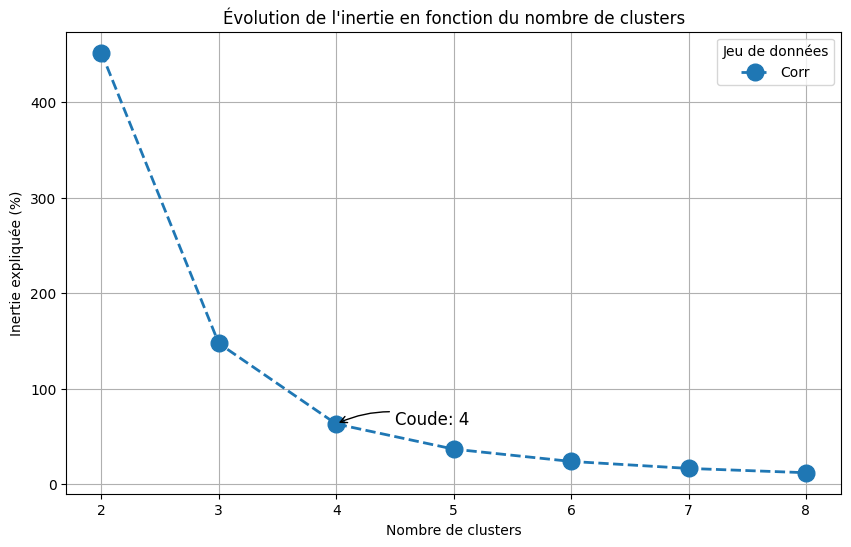

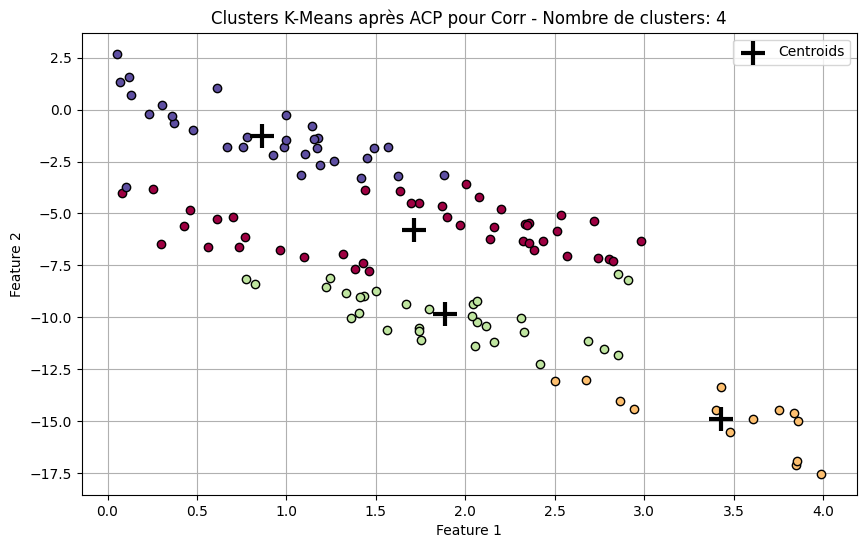

In [192]:
# Initialisation de variables
k_range = range(2, 9)     # Nombre de cluster
tab_data = [df_corr]      # Tableaux de données à étudier
tab_label_data = ['Corr'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Tableau des inerties de Corr :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2     106.597653     133.402347           240.0   
1                   3      60.345667     179.654333           240.0   
2                   4      43.106981     196.893019           240.0   
3                   5      32.609422     207.390578           240.0   
4                   6      24.010594     215.989406           240.0   
5                   7      18.397313     221.602687           240.0   
6                   8      14.481566     225.518434           240.0   

   Inertie expliquée (%)  Inertie par cluster  
0              55.584311            53.298826  
1              74.855972            20.115222  
2              82.038758            10.776745  
3              86.412741             6.521884  
4              89.995586             4.001766  
5              92.334453             2.628188  
6              93.966014             1.810196  



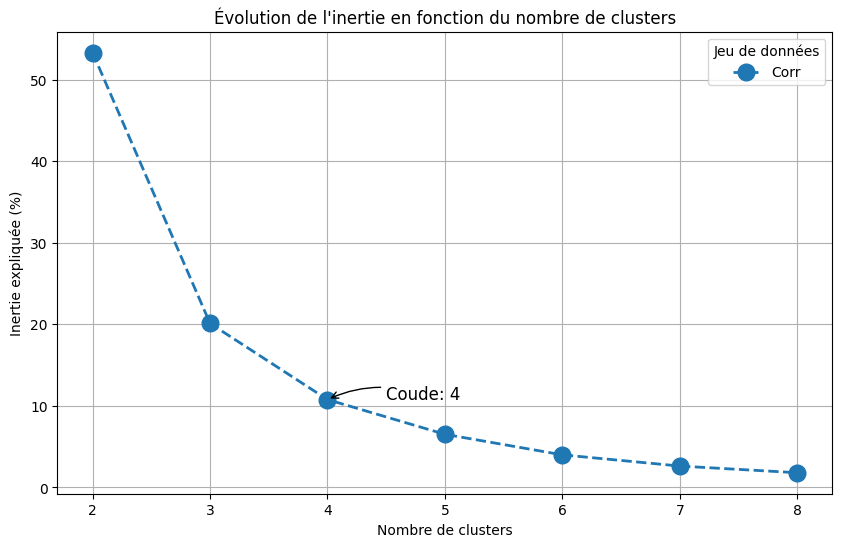

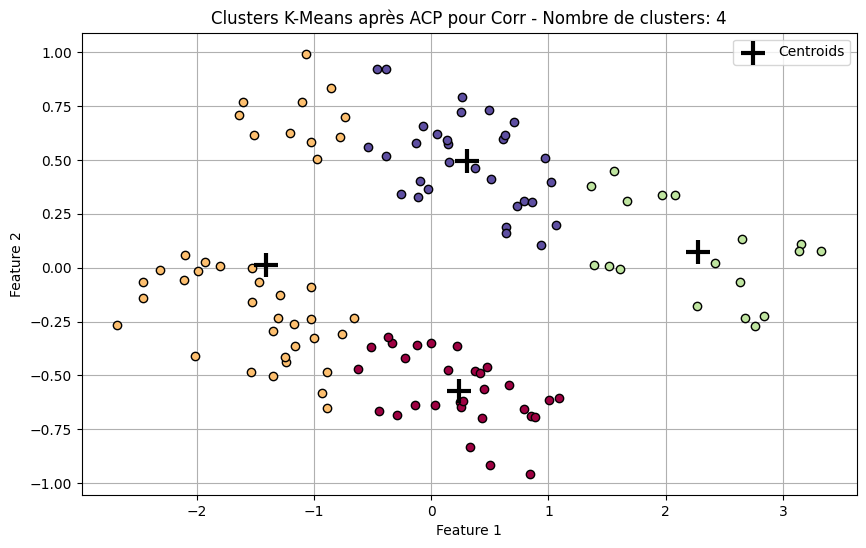

In [193]:
# Initialisation de variables
k_range = range(2, 9)     # Nombre de cluster
tab_data = [acp_corr]      # Tableaux de données à étudier
tab_label_data = ['Corr'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Sur ce jeu de données, la représentation est clairement moins bonne du fait de sa représentation d'origine qui, contrairement aux autres jeux de données, est moins groupée.

Tableau des inerties de Atypique :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2   16635.684795   20952.457218    37588.142013   
1                   3   12141.824213   25446.317801    37588.142013   
2                   4   10930.267012   26657.875002    37588.142013   
3                   5    9814.342836   27773.799177    37588.142013   
4                   6    9050.358955   28537.783059    37588.142013   
5                   7    8614.365938   28973.776075    37588.142013   
6                   8    8115.758647   29472.383367    37588.142013   

   Inertie expliquée (%)  Inertie par cluster  
0              55.742200          8317.842398  
1              67.697727          4047.274738  
2              70.920970          2732.566753  
3              73.889790          1962.868567  
4              75.922303          1508.393159  
5              77.082225          1230.623705  
6              78.408726          1014.469831  



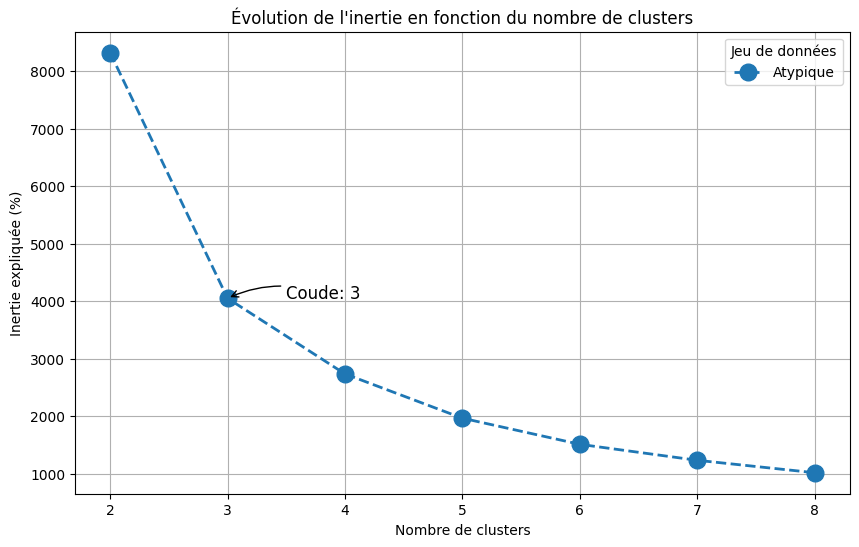

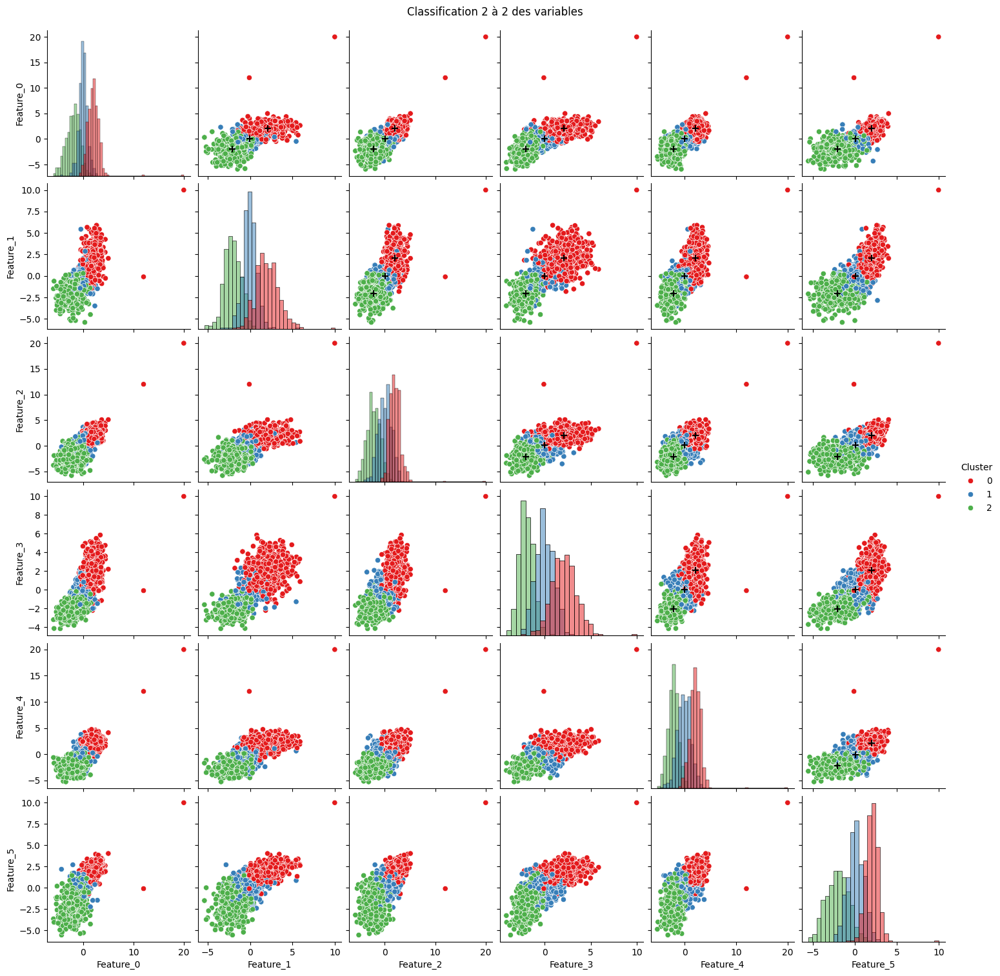

In [194]:
# Initialisation de variables
k_range = range(2, 9)                                    # Nombre de cluster
tab_data = [df_atypique]                                 # Tableaux de données à étudier
tab_label_data = ['Atypique']                            # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

La dissociation du jeu de données Atypique par K-means représente très correctement les 3 clusters 2 à 2 sur les variables. Pour autant, il y a quelques individus assez éloignés qui pourraient êtres considérés comme atypiques.

Tableau des inerties de Atypique :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2    2578.520953    5021.420539     7599.941493   
1                   3    1488.218945    6111.722547     7599.941493   
2                   4    1204.119530    6395.821963     7599.941493   
3                   5     959.554826    6640.386666     7599.941493   
4                   6     816.930729    6783.010764     7599.941493   
5                   7     695.179209    6904.762283     7599.941493   
6                   8     608.563813    6991.377680     7599.941493   

   Inertie expliquée (%)  Inertie par cluster  
0              66.071832          1289.260477  
1              80.418021           496.072982  
2              84.156200           301.029882  
3              87.374181           191.910965  
4              89.250829           136.155121  
5              90.852835            99.311316  
6              91.992520            76.070477  



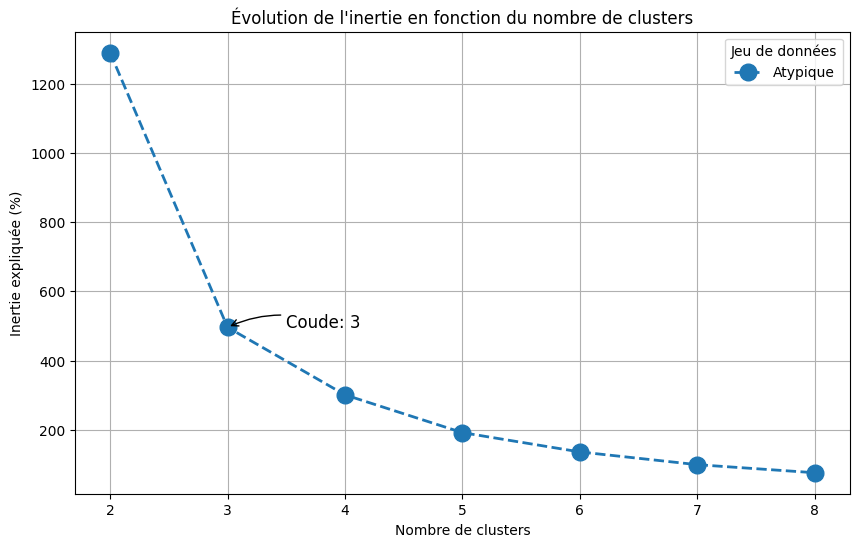

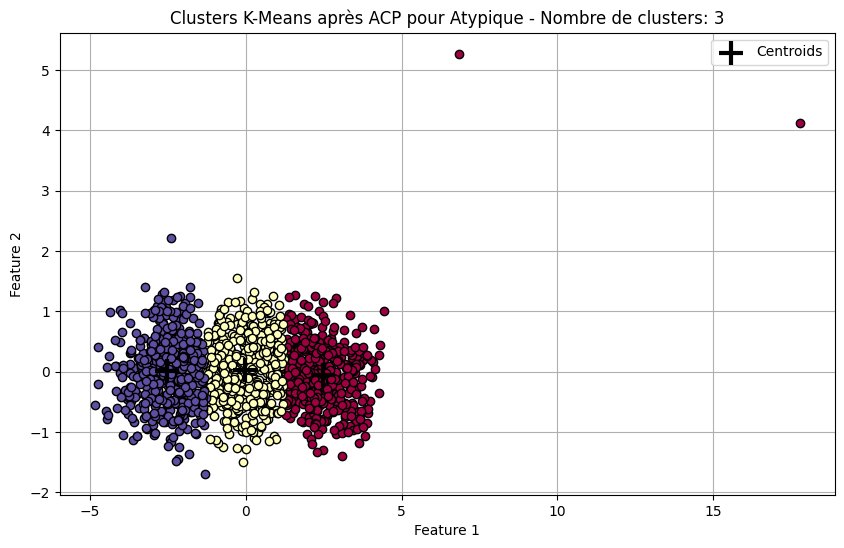

In [195]:
# Initialisation de variables
k_range = range(2, 9)         # Nombre de cluster
tab_data = [acp_atypique]     # Tableaux de données à étudier
tab_label_data = ['Atypique'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Bien que ce jeu de données comporte des données bien plus groupées, les clusters sont très bien déterminés avec encore des individus atypiques assez éloignés. Il serait intéressant de les retirer pour constater une éventuellement amélioration de cette classification.

Tableau des inerties de Random :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2     667.026043     100.440987       767.46703   
1                   3     605.249995     162.217035       767.46703   
2                   4     557.215705     210.251325       767.46703   
3                   5     516.581681     250.885349       767.46703   
4                   6     484.983306     282.483724       767.46703   
5                   7     454.279979     313.187051       767.46703   
6                   8     433.385994     334.081036       767.46703   

   Inertie expliquée (%)  Inertie par cluster  
0              13.087336           333.513022  
1              21.136678           201.749998  
2              27.395486           139.303926  
3              32.690049           103.316336  
4              36.807278            80.830551  
5              40.807883            64.897140  
6              43.530344            54.173249  



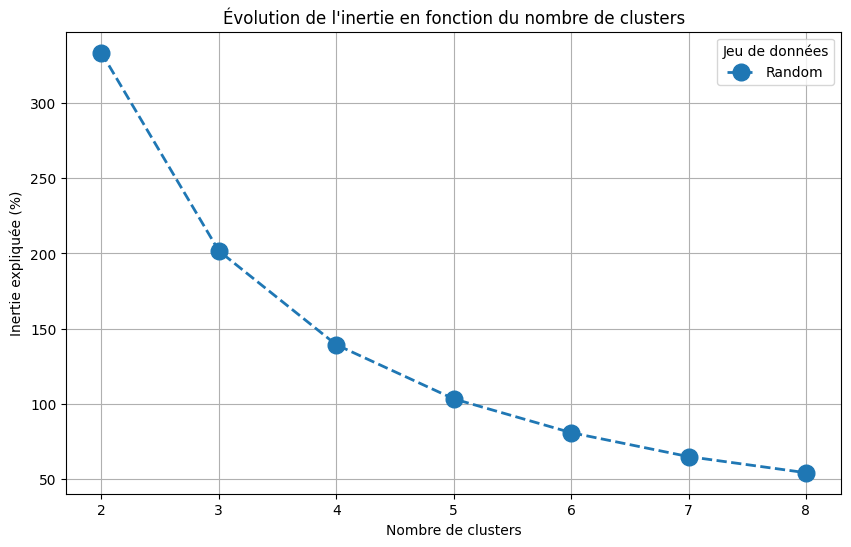

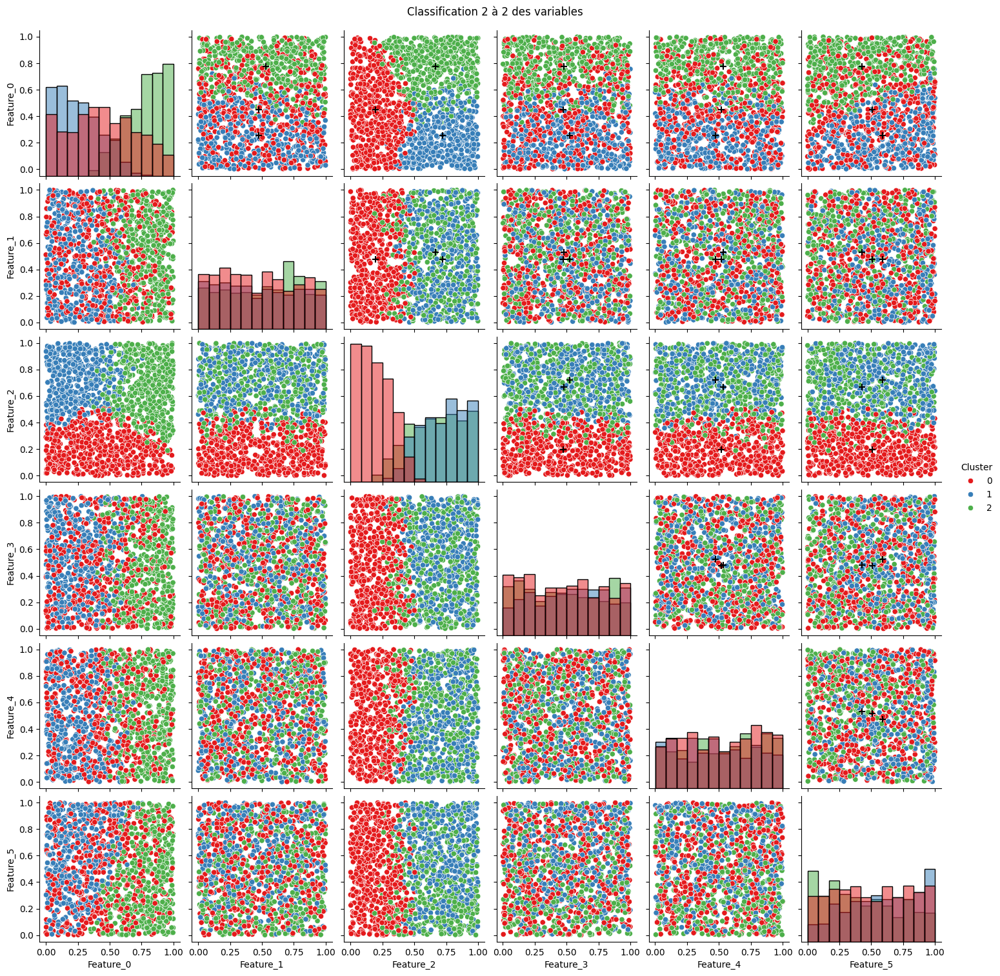

In [133]:
# Initialisation de variables
k_range = range(2, 9)       # Nombre de cluster
tab_data = [df_random]      # Tableaux de données à étudier
tab_label_data = ['Random'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Sur ce jeu de données qu'est random, il est quasi impossible d'effectuer une analyse des résultats sur les nuages de points des variables 2 à 2. Pour autant, certaines combinaisons sont assez intéressantes comme le croisement entre la 1ère et 3ème variable. Dans ce contexte, effectuer le même test avec une ACP appliquée aux données pourrait être intéressante. Mais cela n'est pas étonnant car lorsque l'on regarde l'évolution de l'inertie, le de déterminer un coude sur le graphe. De ce fait, il n'y a pas de meilleur choix de k. Pour cette même raison, k a été fixé arbitrairement à 3.

Tableau des inerties de Random :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2    2125.354105    1113.711752     3239.065857   
1                   3    1425.734871    1813.330986     3239.065857   
2                   4    1078.522534    2160.543323     3239.065857   
3                   5     908.438137    2330.627720     3239.065857   
4                   6     747.244248    2491.821609     3239.065857   
5                   7     646.459463    2592.606394     3239.065857   
6                   8     580.689038    2658.376819     3239.065857   

   Inertie expliquée (%)  Inertie par cluster  
0              34.383733          1062.677053  
1              55.983147           475.244957  
2              66.702667           269.630634  
3              71.953700           181.687627  
4              76.930255           124.540708  
5              80.041793            92.351352  
6              82.072330            72.586130  



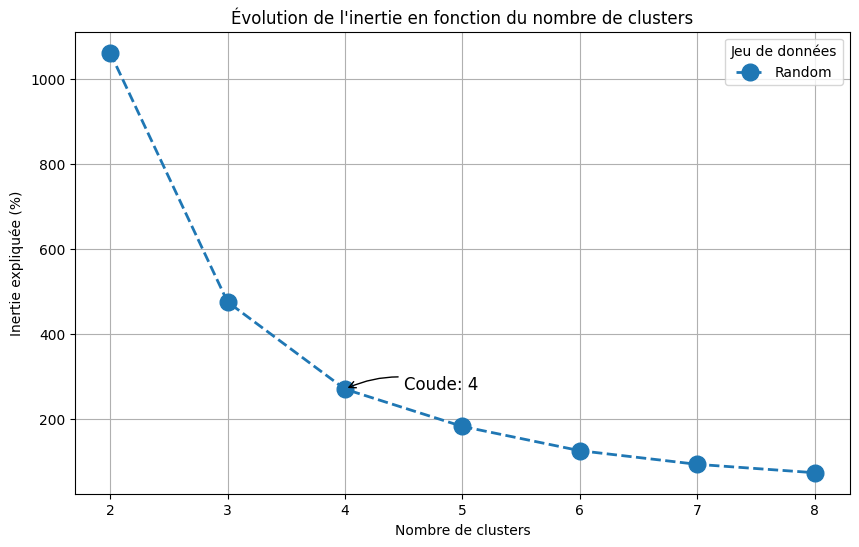

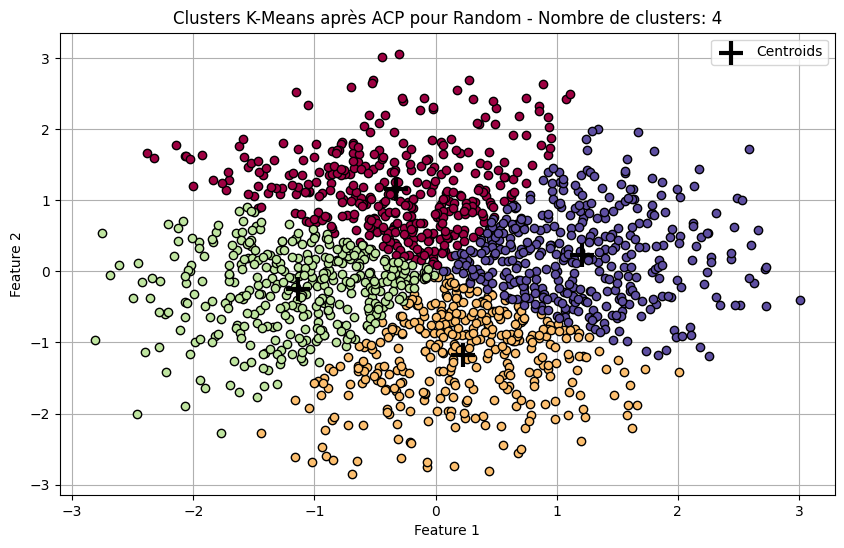

In [196]:
# Initialisation de variables
k_range = range(2, 9)       # Nombre de cluster
tab_data = [acp_random]     # Tableaux de données à étudier
tab_label_data = ['Random'] # Labels associés aux tableaux de données

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=True, pairplot_bool=True)

Pour le coup, effectuer une ACP sur ce jeu de données permet de faire une bien meilleure classification. On distingue très clairement les 4 clusters anoncés par le graphe de l'évolution de l'inertie et l'ACP a l'avantage de classifier les individus et non les variables associées à un individu.

Choix des centroids initiaux :

/home/cytech/.local/lib/python3.8/site-packages/kneed/knee_locator.py:225: RuntimeWarning: invalid value encountered in divide
  return (a - min(a)) / (max(a) - min(a))
/home/cytech/.local/lib/python3.8/site-packages/kneed/knee_locator.py:208: RuntimeWarning: Mean of empty slice.
  self.S * np.abs(np.diff(self.x_normalized).mean())
/home/cytech/.local/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Tableau des inerties de Atypique :

   Nombre de clusters  Inertie intra  Inertie inter  Inertie totale  \
0                   2   36086.952395    1501.189618    37588.142013   

   Inertie expliquée (%)  Inertie par cluster  
0               3.993785         18043.476198  



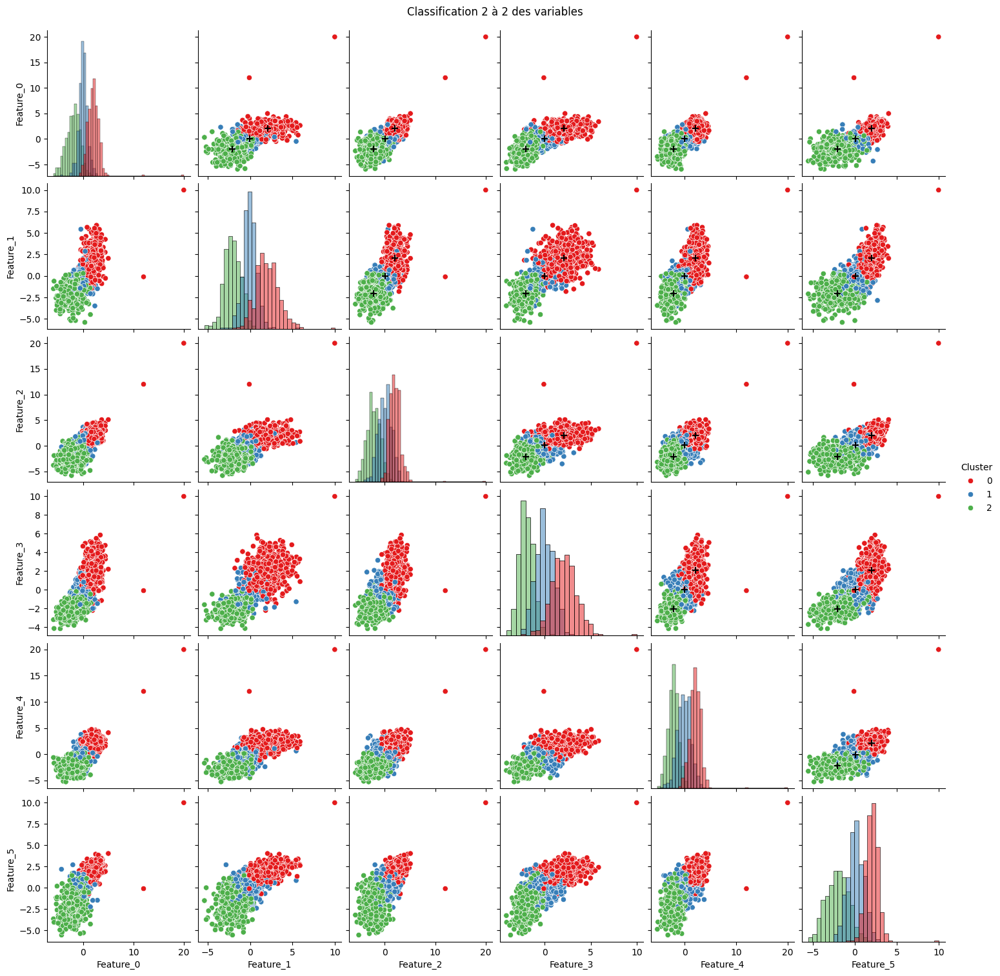

In [135]:
# Initialisation de variables
k_range = range(2, 3)                                    # Nombre de cluster
tab_data = [df_atypique]                                 # Tableaux de données à étudier
tab_label_data = ['Atypique']                            # Labels associés aux tableaux de données
centroids = np.vstack([df_atypique[0], df_atypique[-1]]) # Centroids pour l'initialisation

compute_inertia(k_range, tab_data, tab_label_data, plot_bool=False, pairplot_bool=False, centroid=centroids)

## Algorithme de Classification Hiérarchique Ascendante (CAH)

In [136]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Fonction pour trouver le meilleur nombre de clusters basé sur l'indice de silhouette
def find_best_split(df_scaled, method, max_clusters=10):
    best_num_clusters = 2
    best_silhouette = -1

    # Test de plusieurs nombres de clusters (entre 2 et max_clusters)
    for n_clusters in range(2, max_clusters + 1):
        model = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage=method)
        cluster_labels = model.fit_predict(df_scaled)

        # Calcul de l'indice de silhouette
        silhouette_avg = silhouette_score(df_scaled, cluster_labels)

        # Mise à jour du meilleur score
        if silhouette_avg > best_silhouette:
            best_silhouette = silhouette_avg
            best_num_clusters = n_clusters

    print(f"Meilleur nombre de clusters: {best_num_clusters} avec un indice de silhouette de {best_silhouette:.4f} pour la méthode {method}")
    return best_num_clusters

In [137]:
# Fonction pour calculer les centres des clusters
def calculate_cluster_centers(df_scaled, cluster_labels):
    cluster_centers = []
    for cluster in np.unique(cluster_labels):
        cluster_points = df_scaled[cluster_labels == cluster]
        cluster_center = cluster_points.mean(axis=0)
        cluster_centers.append(cluster_center)
    return np.array(cluster_centers)

In [138]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Fonction CAH avec affichage des centres et coupe du dendrogramme
def cah(datasets, labels, methods, max_clusters=10):
    # Parcourir chaque jeu de données
    for index, dataset in enumerate(datasets):
        # Normalisation des données
        scaler = StandardScaler()
        df_scaled = scaler.fit_transform(dataset)

        # Création de subplots avec 2 lignes (dendrogramme et nuage de points)
        fig, axes = plt.subplots(2, len(methods), figsize=(15, 15))

        # Parcourir chaque méthode pour ce dataset
        for i, method in enumerate(methods):
            # CAH
            cah = linkage(df_scaled, method=method)

            # Déterminer le meilleur nombre de clusters avec l'indice de silhouette
            best_num_clusters = find_best_split(df_scaled, method, max_clusters)

            # Tracer le dendrogramme
            dendrogram(cah, orientation='top', distance_sort='descending', show_leaf_counts=True, ax=axes[0, i])

            # Ajout d'une ligne horizontale pour montrer où couper
            plt.sca(axes[0, i])

            # Titre du dendrogramme
            axes[0, i].set_title(f"Dendrogramme pour {labels[index]} (méthode {method})")
            axes[0, i].set_xlabel('Nombre de clusters')
            axes[0, i].set_ylabel('Distances')

            # Agglomerative clustering pour visualisation
            model = AgglomerativeClustering(n_clusters=best_num_clusters, affinity='euclidean', linkage=method)
            cluster_labels = model.fit_predict(df_scaled)

            # Calcul des centres des clusters
            cluster_centers = calculate_cluster_centers(df_scaled, cluster_labels)

            # Visualisation des clusters avec leurs centres
            axes[1, i].scatter(df_scaled[:, 0], df_scaled[:, 1], c=cluster_labels, cmap='viridis')
            axes[1, i].scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker="+", color='black', s=50, label='Centres')

            # Titre du nuage de points
            axes[1, i].set_title(f"Nuage de points pour {labels[index]} (méthode {method})")
            axes[1, i].set_xlabel('Première composante')
            axes[1, i].set_ylabel('Deuxième composante')
            axes[1, i].legend()

        # Titre global pour le dataset
        fig.suptitle(f"Graphiques pour {labels[index]}", fontsize=16)
        
        # Affichage des subplots
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

Meilleur nombre de clusters: 3 avec un indice de silhouette de 0.6920 pour la méthode ward
Meilleur nombre de clusters: 3 avec un indice de silhouette de 0.6920 pour la méthode average


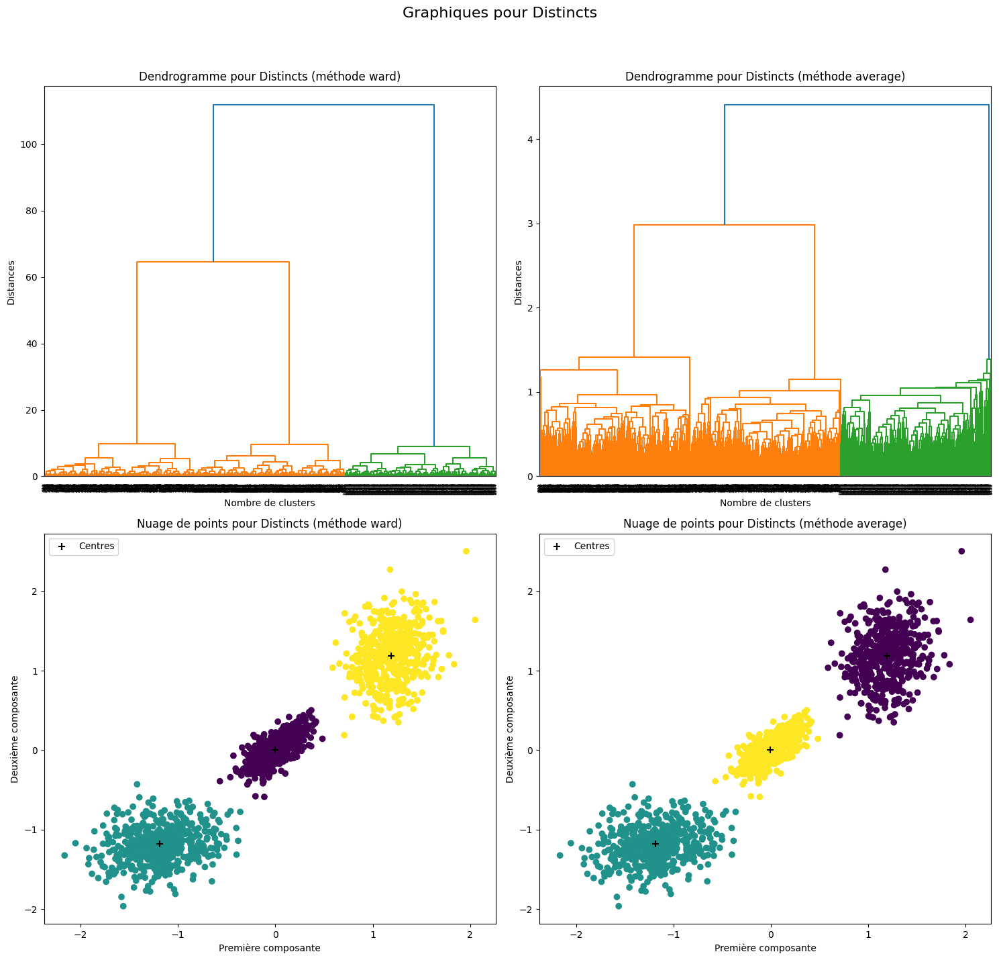

Meilleur nombre de clusters: 2 avec un indice de silhouette de 0.2893 pour la méthode ward
Meilleur nombre de clusters: 2 avec un indice de silhouette de 0.3757 pour la méthode average


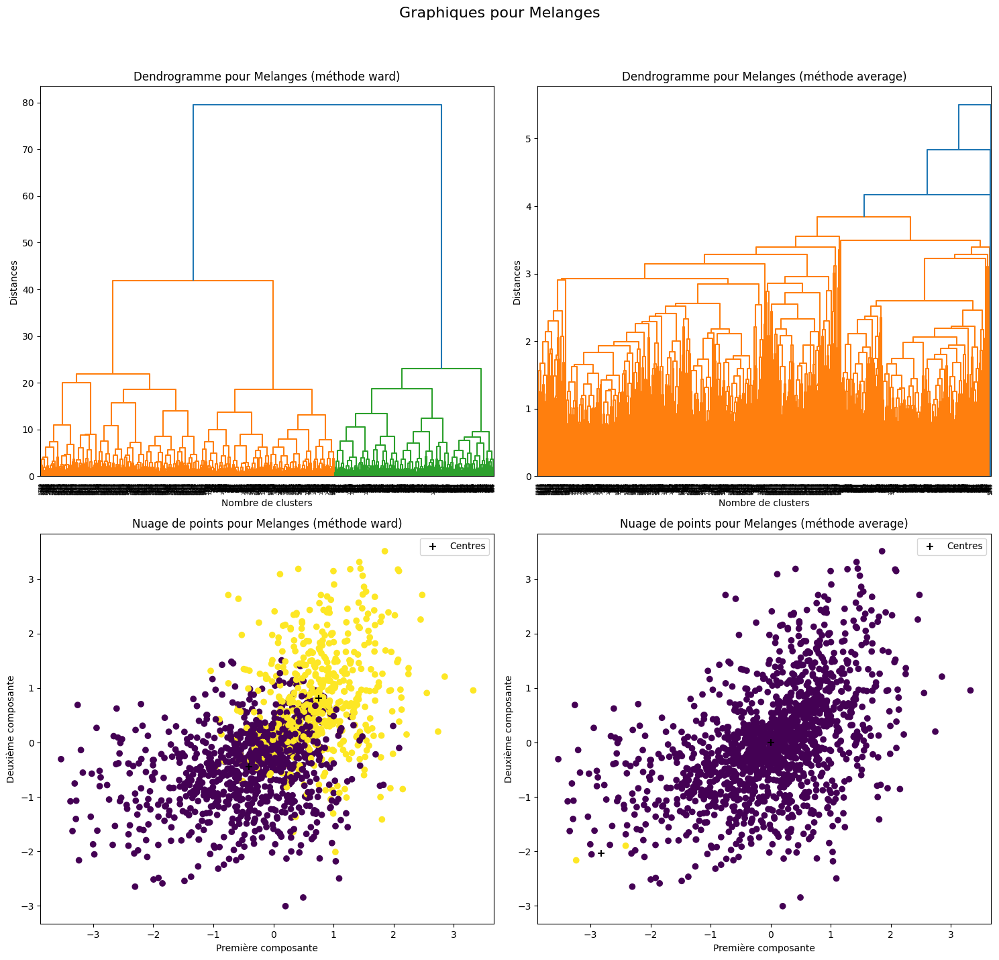

Meilleur nombre de clusters: 2 avec un indice de silhouette de 0.0876 pour la méthode ward
Meilleur nombre de clusters: 2 avec un indice de silhouette de 0.0831 pour la méthode average


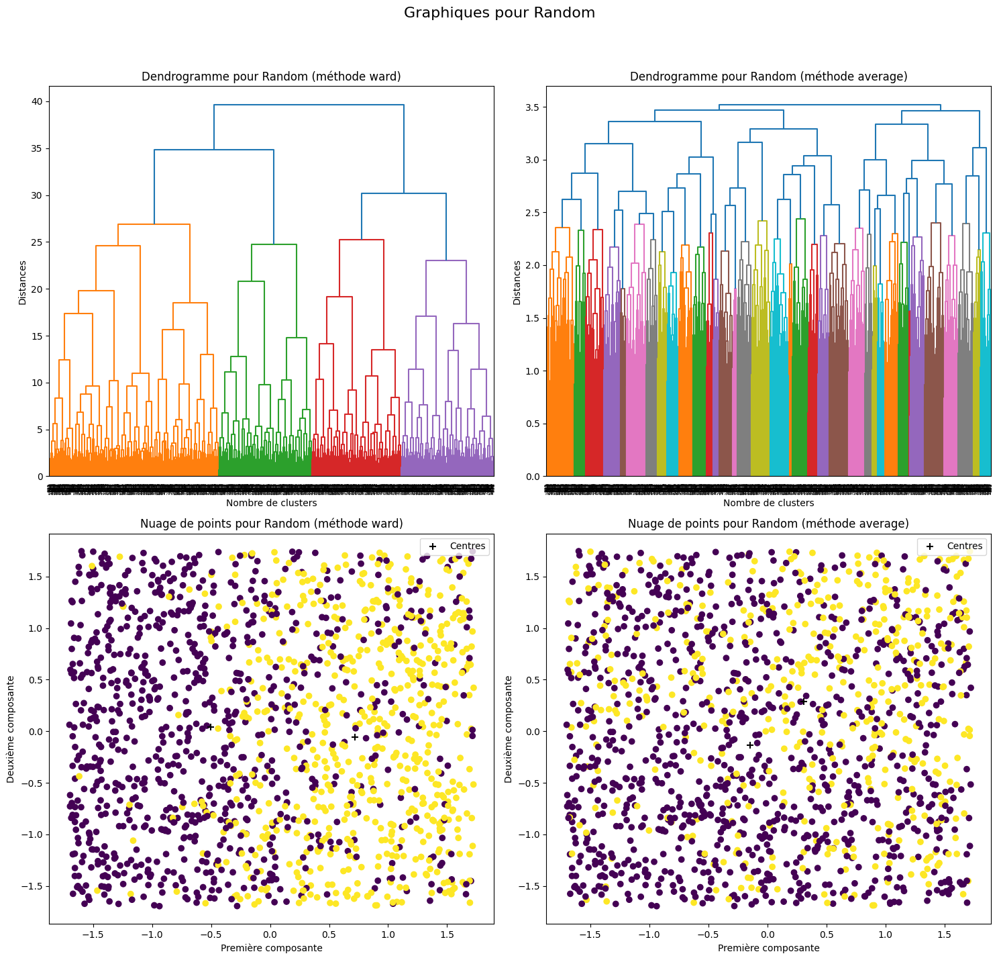

Meilleur nombre de clusters: 2 avec un indice de silhouette de 0.4157 pour la méthode ward
Meilleur nombre de clusters: 2 avec un indice de silhouette de 0.8344 pour la méthode average


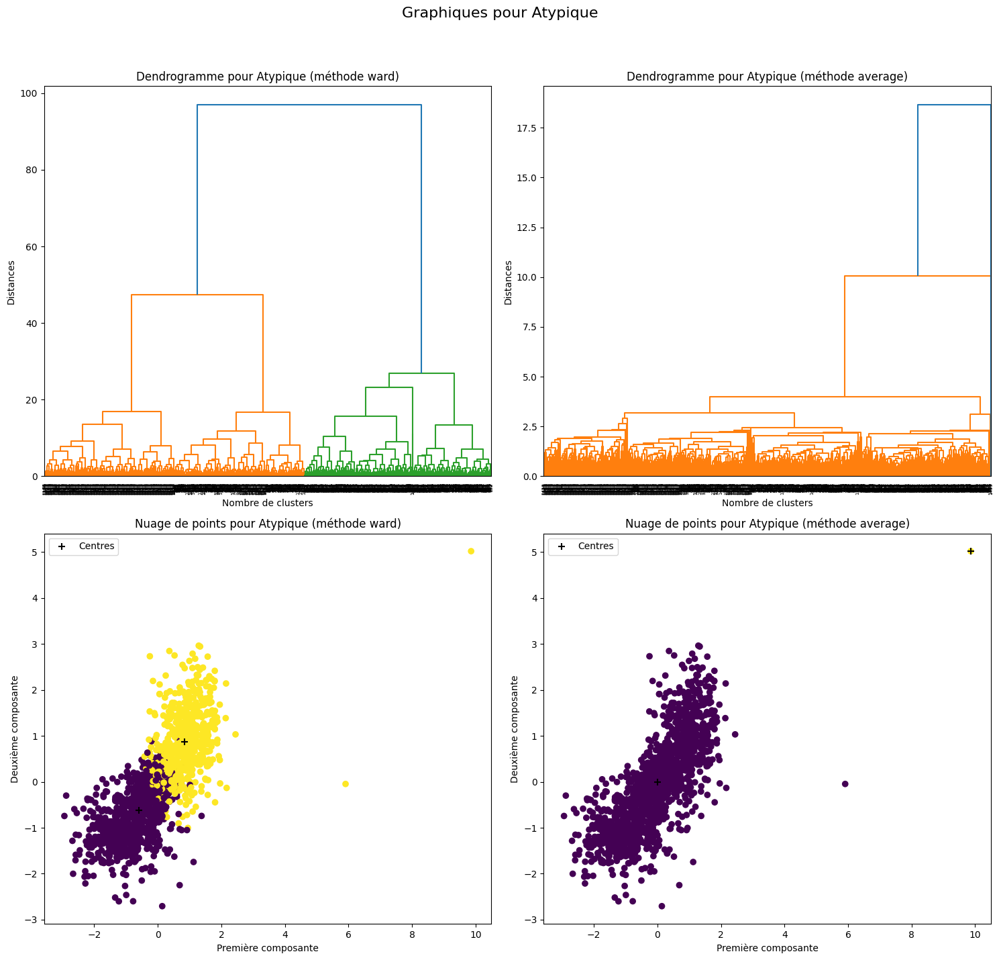

Meilleur nombre de clusters: 6 avec un indice de silhouette de 0.4955 pour la méthode ward
Meilleur nombre de clusters: 9 avec un indice de silhouette de 0.4981 pour la méthode average


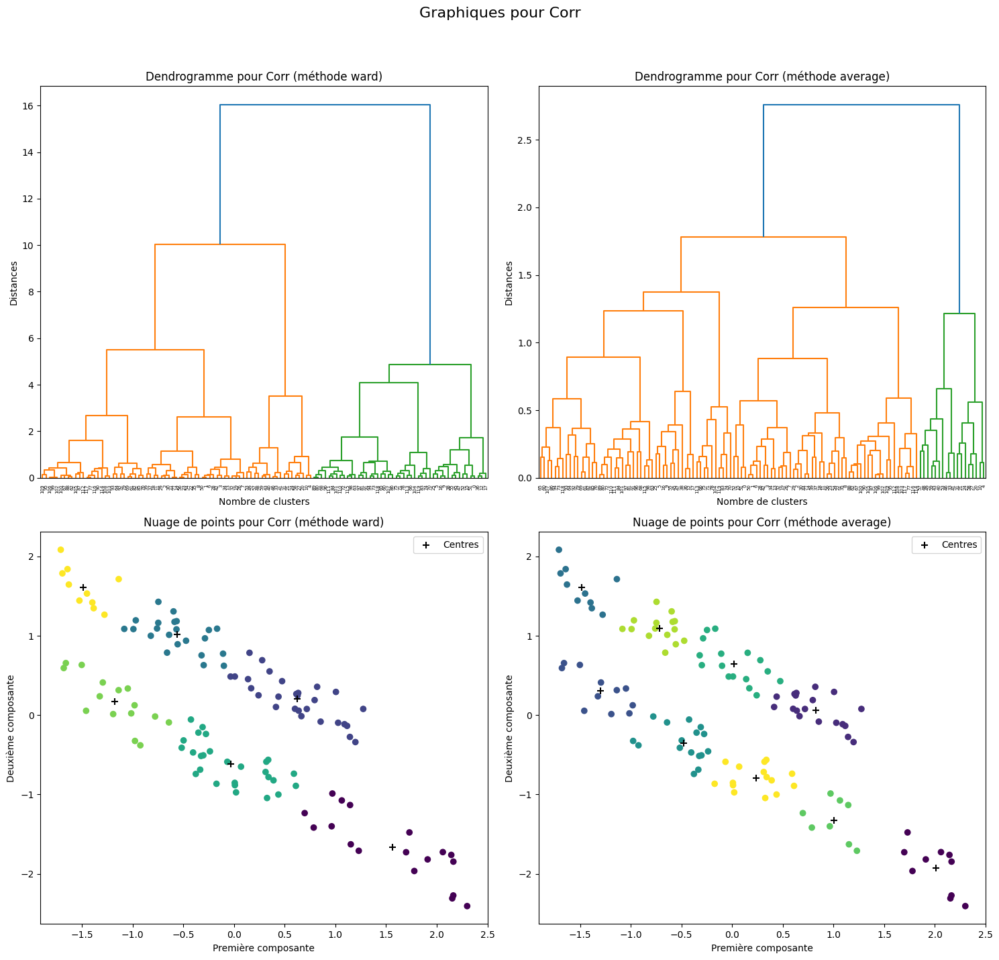

In [139]:
# Initialisation de variables
tab_data = [df_distincts, df_melanges, df_random, df_atypique, df_corr]  # Tableaux de données à étudier
tab_label_data = ['Distincts', "Melanges", "Random", "Atypique", "Corr"] # Labels associés aux tableaux de données
tab_method = ['ward', 'average']                                         # Tableau des méthodes à appliquer

cah(tab_data, tab_label_data, tab_method)

## Algorithme de DBSCAN

### DBSCAN

In [140]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA

def dbscan(data, label, epsilon=None, epsilon_pca=None):
    # Réduction des dimensions à 2 avec PCA
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)

    # Calcul des distances avec NearestNeighbors sur les données originales
    neigh = NearestNeighbors(n_neighbors=2)
    nbrs = neigh.fit(data)
    distances, indices = nbrs.kneighbors(data)
    distances = np.sort(distances, axis=0)
    distances = distances[:, 1]

    # Calcul des distances avec NearestNeighbors sur les données PCA
    neigh_pca = NearestNeighbors(n_neighbors=2)
    nbrs_pca = neigh_pca.fit(data_pca)
    distances_pca, indices_pca = nbrs_pca.kneighbors(data_pca)
    distances_pca = np.sort(distances_pca, axis=0)
    distances_pca = distances_pca[:, 1]

    # Calcul de la valeur ε pour 90% des observations sur les données originales et PCA
    if not epsilon:
        epsilon = np.percentile(distances, 90)
    index_epsilon = np.where(distances >= epsilon)[0][0]

    if not epsilon_pca:
        epsilon_pca = np.percentile(distances_pca, 90)
    index_epsilon_pca = np.where(distances_pca >= epsilon_pca)[0][0]

    # DBSCAN sur les données originales
    y_pred = DBSCAN(eps=epsilon, min_samples=5).fit(data)
    labels = y_pred.labels_

    # DBSCAN sur les données avec PCA
    y_pred_pca = DBSCAN(eps=epsilon_pca, min_samples=5).fit(data_pca)
    labels_pca = y_pred_pca.labels_

    # Nombre de clusters et points bruités pour les données originales
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    # Nombre de clusters et points bruités pour les données avec PCA
    n_clusters_pca = len(set(labels_pca)) - (1 if -1 in labels_pca else 0)
    n_noise_pca = list(labels_pca).count(-1)

    # Affichage des distances avec deux sous-graphiques
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))

    # Premier subplot : distances des données originales
    ax[0].plot(distances)
    ax[0].axhline(y=epsilon, color='r', linestyle='--', label=f'ε = {epsilon:.4f}')
    ax[0].annotate(f'ε = {epsilon:.4f}',
                   xy=(index_epsilon, epsilon),
                   xytext=(index_epsilon + 0.01, epsilon - 0.1),
                   arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2"),
                   fontsize=12)
    ax[0].set_title(f'Distances au plus proche voisin pour {label} (Original)\n'
                    f'Clusters: {n_clusters_}, ε: {epsilon:.4f}, Noise Points: {n_noise_}')
    ax[0].set_xlabel('Index des observations')
    ax[0].set_ylabel('Distance au plus proche voisin')
    ax[0].legend()
    ax[0].grid(True)

    # Deuxième subplot : distances des données PCA
    ax[1].plot(distances_pca)
    ax[1].axhline(y=epsilon_pca, color='r', linestyle='--', label=f'ε = {epsilon_pca:.4f}')
    ax[1].annotate(f'ε = {epsilon_pca:.4f}',
                    xy=(index_epsilon_pca, epsilon_pca),
                    xytext=(index_epsilon_pca + 0.01, epsilon_pca - 0.1),
                    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2"),
                    fontsize=12)
    ax[1].set_title(f'Distances au plus proche voisin pour {label} (PCA)\n'
                    f'Clusters: {n_clusters_pca}, ε: {epsilon_pca:.4f}, Noise Points: {n_noise_pca}')
    ax[1].set_xlabel('Index des observations')
    ax[1].set_ylabel('Distance au plus proche voisin')
    ax[1].legend()
    ax[1].grid(True)

    plt.tight_layout()  # Ajuster la disposition
    plt.show()

    return labels, n_clusters_, labels_pca, n_clusters_pca

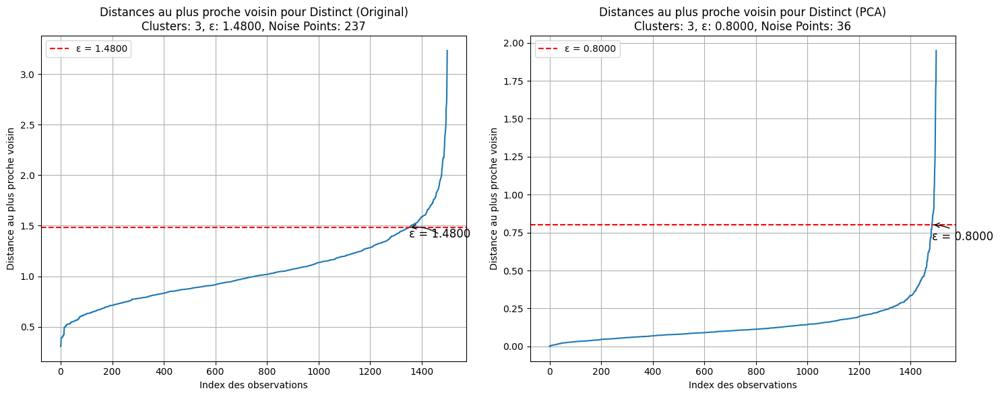

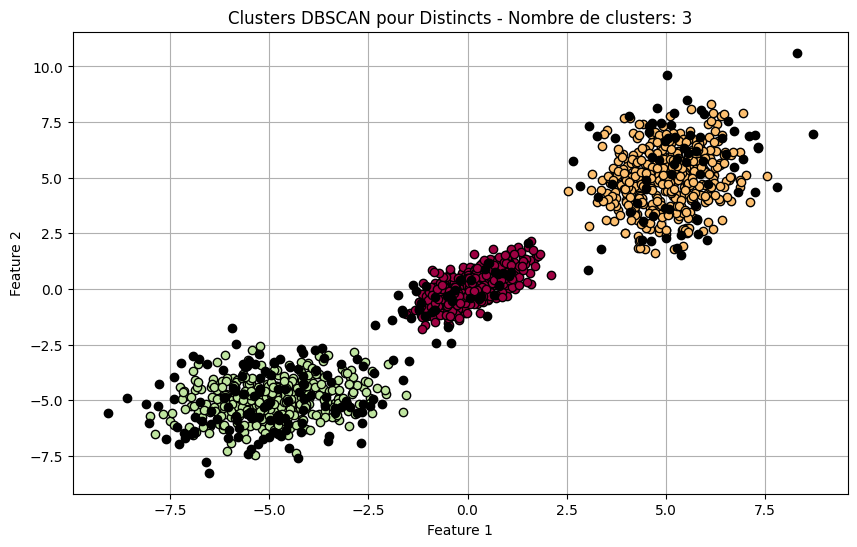

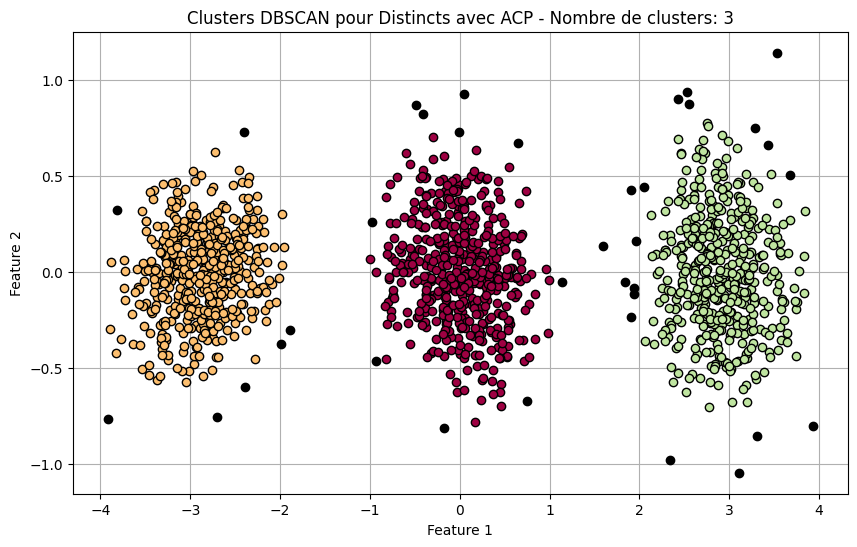

In [141]:
labels_distincts, n_clusters_distincts, labels_distincts_pca, n_clusters_distincts_pca = dbscan(df_distincts, 'Distinct', epsilon_pca = 0.8)

plot_clusters(df_distincts, labels_distincts, n_clusters_distincts, "Clusters DBSCAN pour Distincts")
plot_clusters(acp_distincts, labels_distincts_pca, n_clusters_distincts_pca, "Clusters DBSCAN pour Distincts avec ACP")

Sans ACP, les clusters sont assez distincts bien qu'il y ait assez de bruit sur les variables. Par contre, pour l'ACP, DBSCAN génère 27 clusters lorsque epsilon est fixé par défaut à 90% des individus. Pour pallier cela, il faut le fixer manuellement et, ici, fixé à 0.8 il permet d'obtenir 8 clusters.

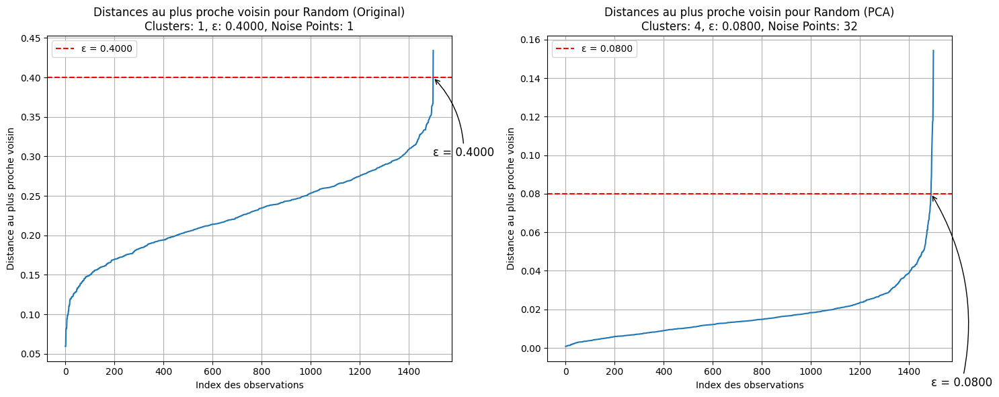

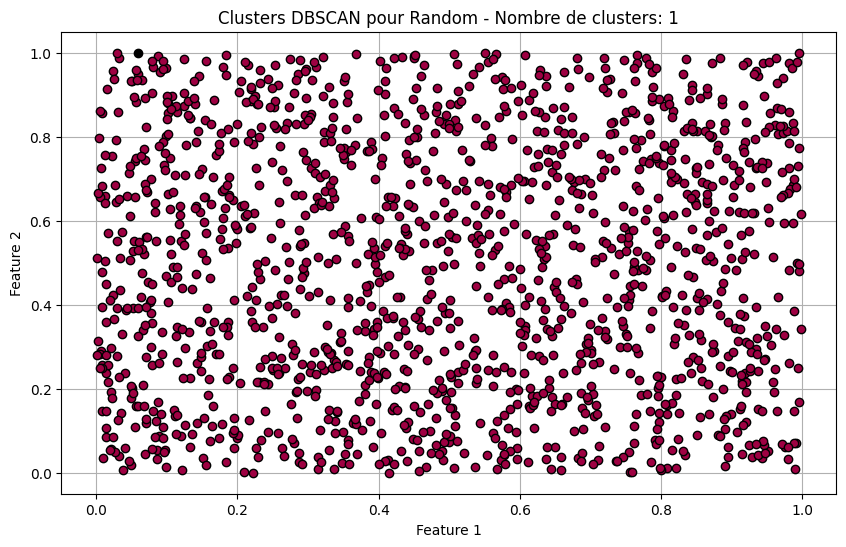

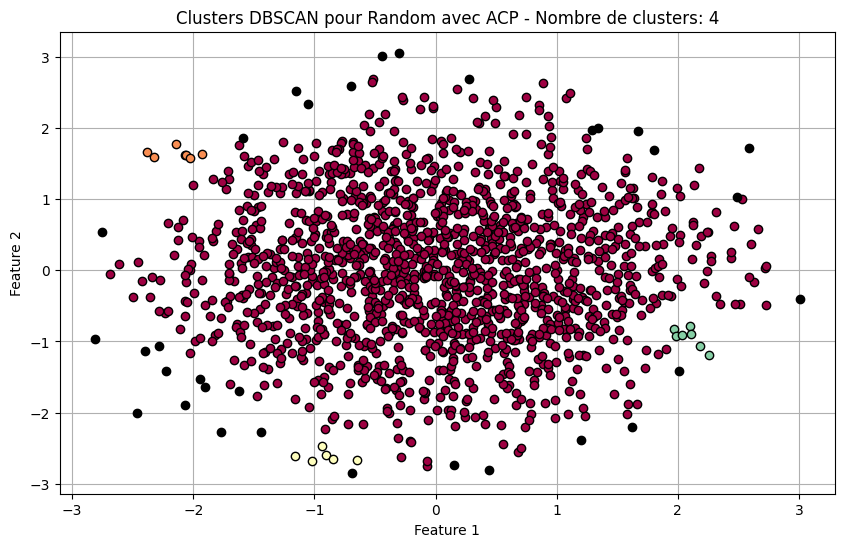

In [142]:
labels_random, n_clusters_random, labels_random_pca, n_clusters_random_pca = dbscan(df_random, 'Random', epsilon=0.4, epsilon_pca=0.08)

plot_clusters(df_random, labels_random, n_clusters_random, "Clusters DBSCAN pour Random")
plot_clusters(acp_random, labels_random_pca, n_clusters_random_pca, "Clusters DBSCAN pour Random avec ACP")

Ce jeu de données étant mal représenté, il était difficile d'y effectuer du clustering. C'est ce qui explique qu'il a fallut ajuster le epsilon de DBSCAN manuellement en le fixant avec une valeur assez élevée.

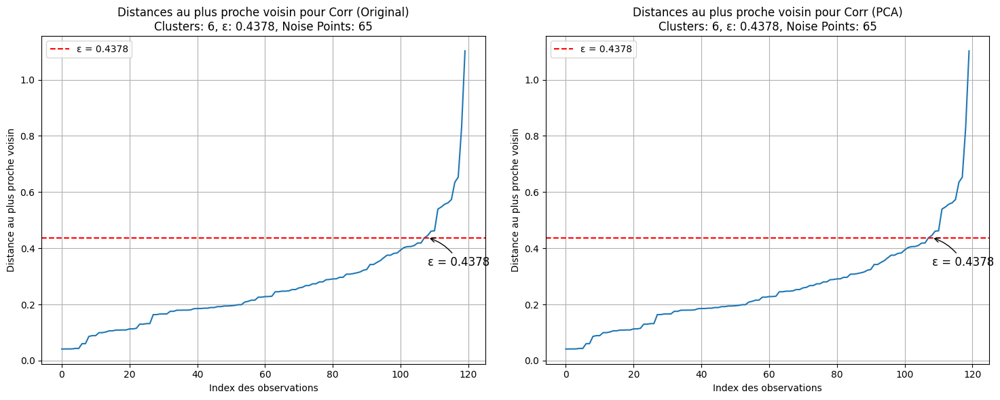

In [144]:
labels_corr, n_clusters_corr, labels_corr_pca, n_clusters_corr_pca = dbscan(df_corr, 'Corr')

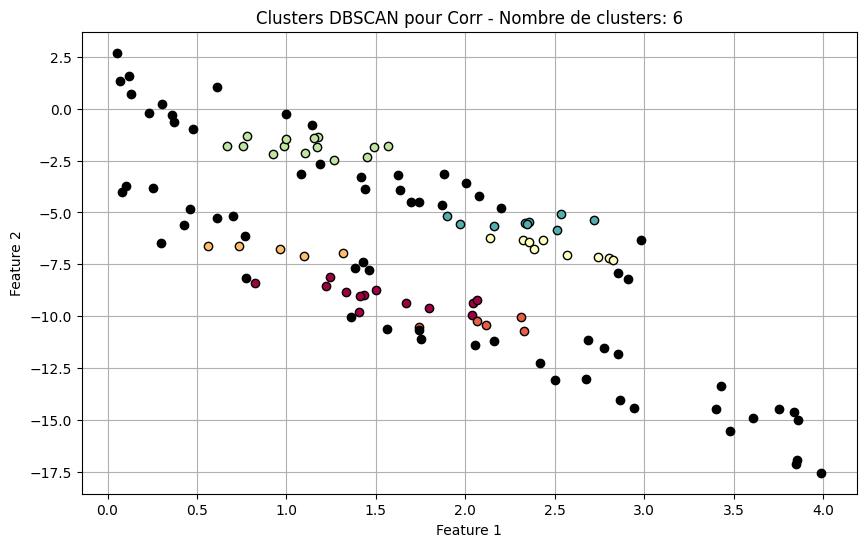

In [145]:
plot_clusters(df_corr, labels_corr, n_clusters_corr, "Clusters DBSCAN pour Corr")